<a href="https://colab.research.google.com/github/askolesov0608/SJK0015/blob/main/chap15_FIN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

------ standard imports ------ #

# Robotics, Vision & Control 3e: for Python
## Chapter 15: Vision-Based Control

In [ ]:
import numpy as np
from scipy import linalg
import matplotlib.pyplot as plt
import math
from math import pi
np.set_printoptions(linewidth=120, formatter={'float': lambda x: f"{0:8.4g}" if abs(x) < 1e-10 else f"{x:8.4g}"})

In [ ]:
try:
    import google.colab
    print('Running on CoLab')
    !pip install matplotlib
    !pip install machinevision-toolbox-python
    !pip install --no-deps rvc3python
    COLAB = True
except:
    COLAB = False

Running on CoLab
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.0/238.0 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.9/184.9 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.7/128.7 MB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.2/204.2 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 73.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468

In [ ]:
np.random.seed(0)

In [ ]:
from machinevisiontoolbox.base import *
from machinevisiontoolbox import *
from spatialmath.base import *
from spatialmath import *

------------------------------ #

# 15.1 Position-Based Visual Servoing


In [ ]:
camera = CentralCamera.Default(pose=SE3.Trans(1, 1, -2));

In [ ]:
camera

           Name: default perspective camera [CentralCamera]
     pixel size: 1e-05 x 1e-05
     image size: 1000 x 1000
           pose: t = 1, 1, -2; rpy/yxz = 0°, 0°, 0°
   principal pt: [     500      500]
   focal length: [   0.008    0.008]

In [ ]:
P = mkgrid(2, 0.5) # объект в виде сетки точек (P), расположенных на равных расстояниях.

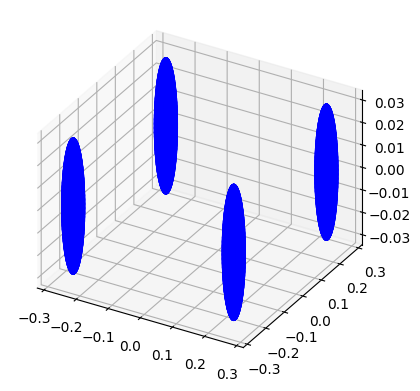

In [ ]:
plot_sphere(0.03, P, color="blue")

In [ ]:
P # объект в виде сетки точек (P), расположенных на равных расстояниях.

array([[   -0.25,    -0.25,     0.25,     0.25],
       [   -0.25,     0.25,     0.25,    -0.25],
       [       0,        0,        0,        0]])

In [ ]:
#Проекция Точек
p = camera.project_point(P, objpose=SE3.Tz(1)) #Точки объекта проецируются на изображение камеры

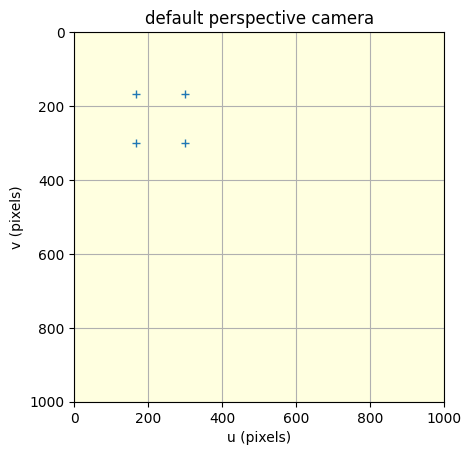

array([[   166.7,    166.7,      300,      300],
       [   166.7,      300,      300,    166.7]])

In [ ]:
camera.plot_point(p, "+") #Вывод на печать

In [ ]:
#Оценка Позиции
Te_C_G = camera.estpose(P, p, frame="camera"); #затем оценивается позиция камеры относительно объекта.
Te_C_G.printline()

t = -1, -1, 3; rpy/zyx = 0°, 0°, 0°


In [ ]:
#Определение Желаемой Позиции
T_Cd_G = SE3.Tz(1); #Задается желаемая позиция камеры (T_Cd_G)
T_Cd_G

   1         0         0         0         
   0         1         0         0         
   0         0         1         1         
   0         0         0         1         


In [ ]:
T_Cd_G.printline()

t = 0, 0, 1; rpy/zyx = 0°, 0°, 0°


In [ ]:
# Вычисление Дельта-Трансформации
T_delta = Te_C_G * T_Cd_G.inv(); #вычисляется разность текущей оцененной позиции и желаемой.
T_delta.printline()

t = -1, -1, 2; rpy/zyx = 0°, 0°, 0°


In [ ]:
#Интерполяция и Обновление Позиции Камеры
camera.pose = camera.pose * T_delta.interp1(0.05); #Позиция камеры обновляется на небольшой шаг в направлении к желаемой позиции.

In [ ]:
camera.pose

   1         0         0         0.95      
   0         1         0         0.95      
   0         0         1        -1.9       
   0         0         0         1         


In [ ]:
camera.pose.printline()

t = 0.95, 0.95, -1.9; rpy/zyx = 0°, 0°, 0°


In [ ]:
camera = CentralCamera.Default(pose = SE3.Trans(1, 1, -2));
                               #Создается объект камеры с использованием метода по умолчанию (Default),
                               #который задает стандартные параметры камеры (например, фокусное расстояние, размер изображения).
                               #Камера инициализируется с определенным начальным положением в пространстве,
                               #используя трансформацию SE3.Trans(1, 1, -2),
                               #что означает смещение камеры на (1, 1, -2) относительно глобального начала координат.

In [ ]:
camera

           Name: default perspective camera [CentralCamera]
     pixel size: 1e-05 x 1e-05
     image size: 1000 x 1000
           pose: t = 1, 1, -2; rpy/yxz = 0°, 0°, 0°
   principal pt: [     500      500]
   focal length: [   0.008    0.008]

In [ ]:
#Желаемая Позиция
T_Cd_G = SE3.Tz(1);  #SE3.Tz(1): Определяет желаемую конечную позицию камеры,
                      #где она должна находиться на расстоянии
                      #1 единицы вперед от начальной позиции по оси Z.

In [ ]:
T_Cd_G

   1         0         0         0         
   0         1         0         0         
   0         0         1         1         
   0         0         0         1         


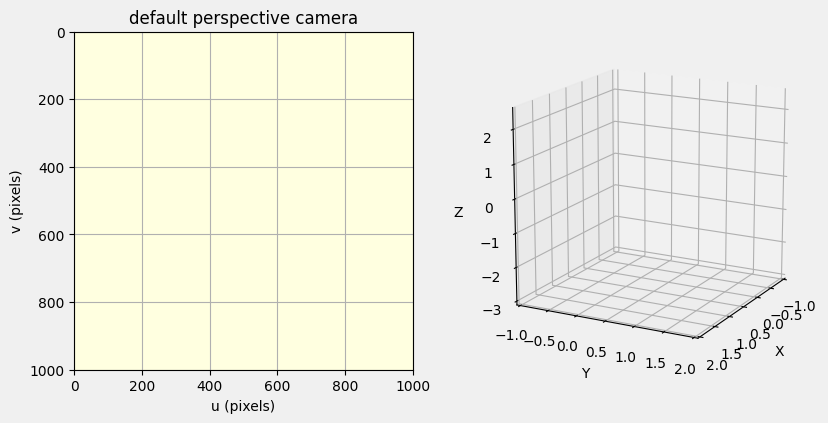

In [ ]:
#Инициализация и Запуск PBVS
pbvs = PBVS(camera, P=P, pose_g=SE3.Trans(-1, -1, 2), pose_d=T_Cd_G, plotvol=[-1, 2, -1, 2, -3, 2.5])
      #PBVS(...): Создается объект pbvs системы визуального сервоинга. В его параметрах указаны:
        #camera: используемая камера.
          #P=P: целевые точки в мире, которые камера должна "видеть" с желаемой позиции.
            #pose_g=SE3.Trans(-1, -1, 2): глобальная позиция объекта относительно начала координат.
              #pose_d=T_Cd_G: желаемая позиция камеры относительно объекта.
                #plotvol=[-1, 2, -1, 2, -3, 2.5]: параметры для визуализации рабочей области, включая минимумы и максимумы по осям X, Y и Z.

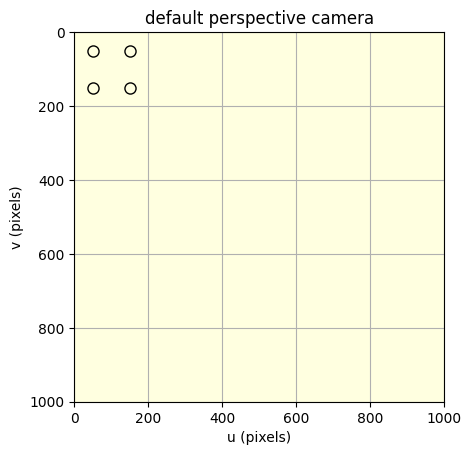

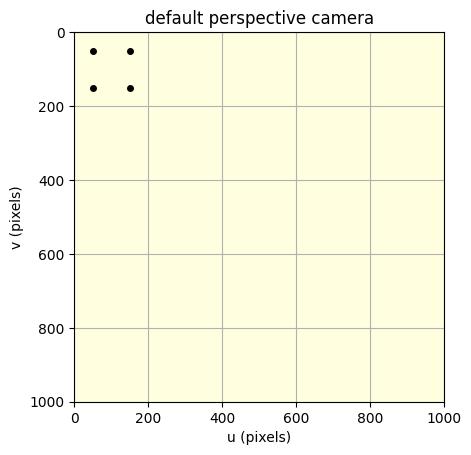

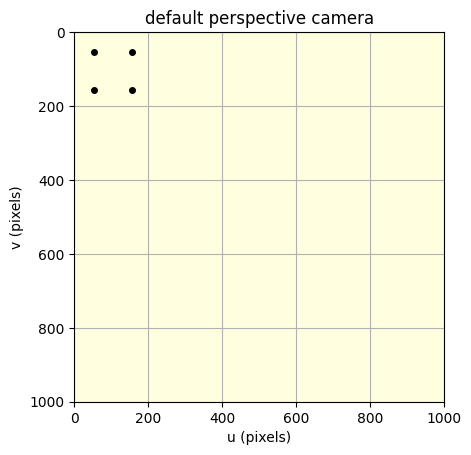

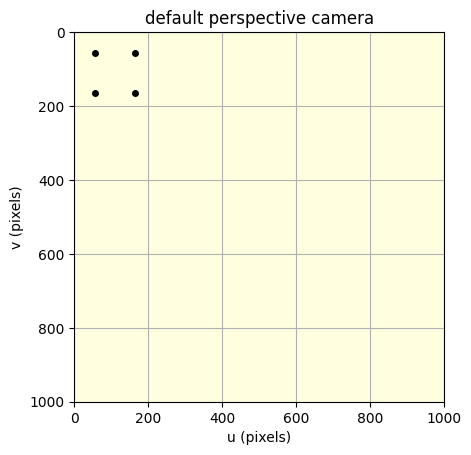

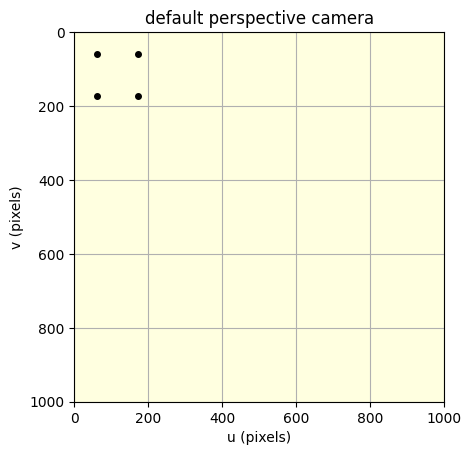

...

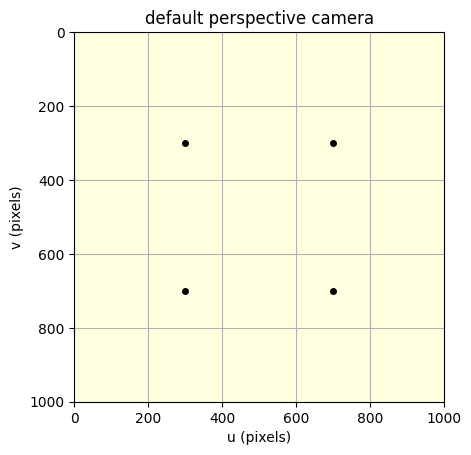

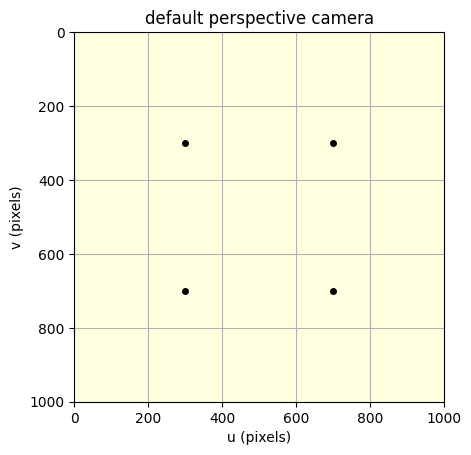

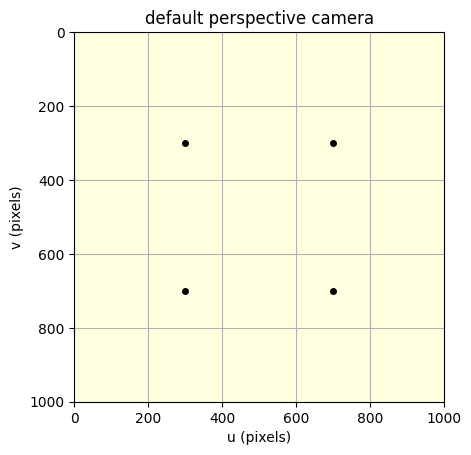

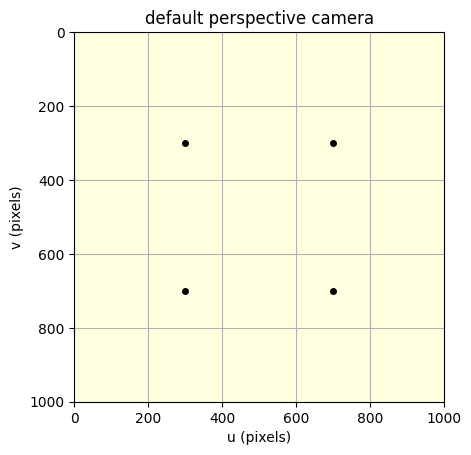

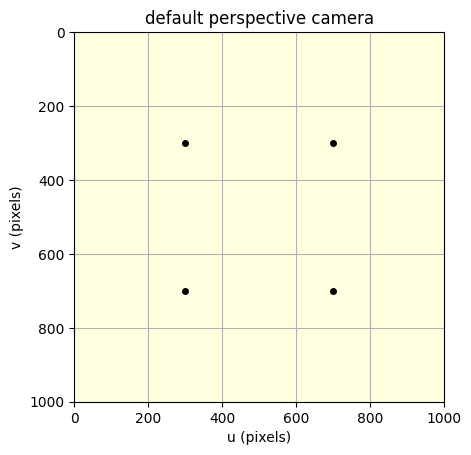

completed on iteration count


In [ ]:
pbvs.run(200); # Запускает процесс PBVS, где 200 указывает на количество итераций (шагов) выполнения алгоритма.
               #В ходе выполнения алгоритма система пытается минимизировать разницу между текущим положением камеры и желаемым,
               #основываясь на анализе проекций целевых точек P на изображение камеры.

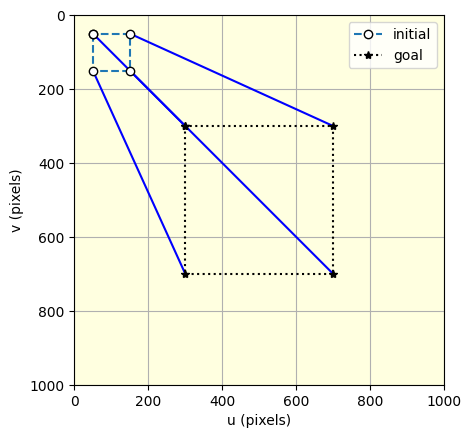

In [ ]:
pbvs.plot_p();     # plot image plane trajectory



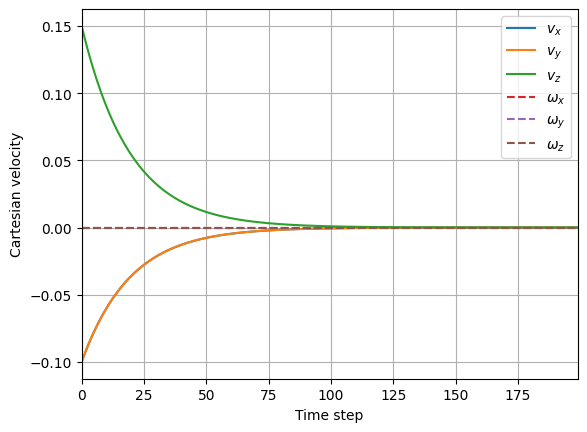

In [ ]:
pbvs.plot_vel();   # plot camera velocity

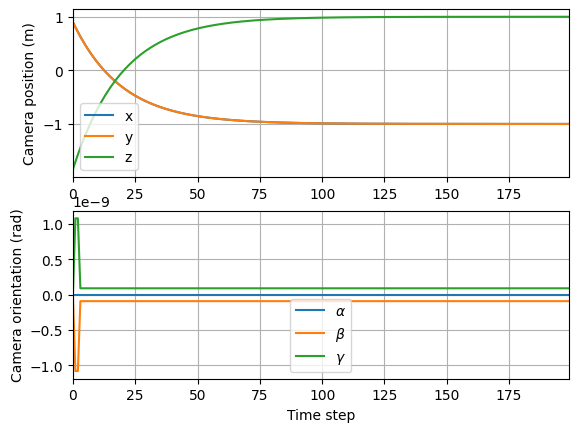

In [ ]:
pbvs.plot_pose();  # plot camera trajectory

# 15.2 Image-Based Visual Servoing


## 15.2.1 Camera and Image Motion


 (IBVS, Управление на Основе Визуального Изображения) основное внимание уделяется минимизации разницы между текущими и желаемыми позициями объектов непосредственно на изображении,

 в отличие от PBVS, где управление осуществляется на основе позиций в трехмерном пространстве.

В IBVS задача состоит в том, чтобы управлять движением камеры таким образом, чтобы определенные визуальные признаки

(например, углы объекта или специфические точки на объекте)

заняли желаемое положение в координатах изображения.

 Этот подход обеспечивает ряд преимуществ, таких как прямая зависимость управления от визуальной информации и устойчивость к неточностям модели камеры или окружающей среды.

*Основные Концепции:*
Определение Признаков: Выбор визуальных признаков на объекте, которые легко идентифицируемы и отслеживаемы на последовательности изображений.


*Желаемые и Текущие Положения Признаков:* Задание желаемого расположения этих признаков на изображении и измерение их текущего положения.


*Вычисление Ошибки:* Разница между текущим и желаемым положениями признаков представляет собой ошибку визуального сервоинга, которую необходимо минимизировать.


*Определение Управляющего Воздействия:* На основе ошибки вычисляется управляющее воздействие, которое должно изменить положение и ориентацию камеры так, чтобы уменьшить ошибку.

In [ ]:
camera = CentralCamera.Default(); #Cоздается объект камеры с настройками по умолчанию
camera

           Name: default perspective camera [CentralCamera]
     pixel size: 1e-05 x 1e-05
     image size: 1000 x 1000
           pose: t = 0, 0, 0; rpy/yxz = 0°, 0°, 0°
   principal pt: [     500      500]
   focal length: [   0.008    0.008]

In [ ]:
P = [1, 1, 5]; # задается точка P в пространстве перед камерой.
P

[1, 1, 5]

In [ ]:
#Проекция Точки на Плоскость Изображения
p0 = camera.project_point(P)  #Точка P проецируется на плоскость изображения камеры, получая координаты p0 на этой плоскости.

In [ ]:
p0

array([[     660],
       [     660]])

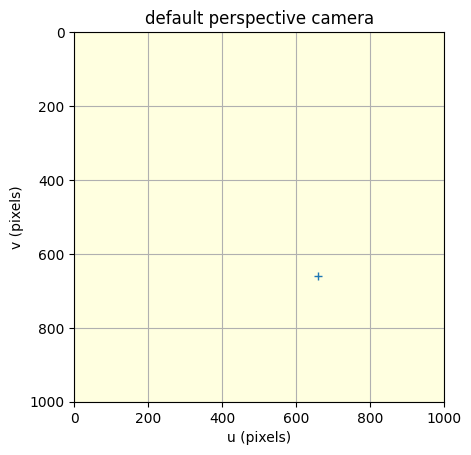

array([[     660],
       [     660]])

In [ ]:
camera.plot_point(p0, "+") #Вывод на печать

In [ ]:
#Вычисление Движения Изображения При Перемещении Камеры
p_dx = camera.project_point(P, pose=SE3.Tx(0.1))

In [ ]:
p_dx

array([[     644],
       [     660]])

In [ ]:
(p_dx - p0) / 0.1  #Рассчитывается, как изменится проекция точки P на плоскости изображения,
                   #если камера переместится вдоль оси X на 0.1 единицы.

array([[    -160],
       [       0]])

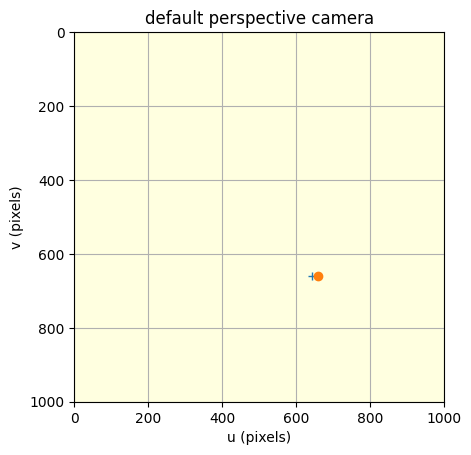

In [ ]:
#camera.plot_point(p_dx, "+") #Вывод на печать
#camera.plot_point(p0, "o") #Вывод на печать
with plt.ioff():
    camera.plot_point(p_dx, "+");
    camera.plot_point(p0, "o");    # show projected points
plt.show()

Аналогичные Вычисления для Других Движений Камеры

Вычисления повторяются для других видов движений камеры (вдоль оси Z и вращение вокруг оси X), чтобы увидеть, как изменится проекция точки при этих движениях.

In [ ]:
(camera.project_point(P, pose=SE3.Tz(0.1) ) - p0) / 0.1

array([[   32.65],
       [   32.65]])

In [ ]:
(camera.project_point(P, pose=SE3.Rx(0.1)) - p0) / 0.1

array([[   40.96],
       [   851.9]])

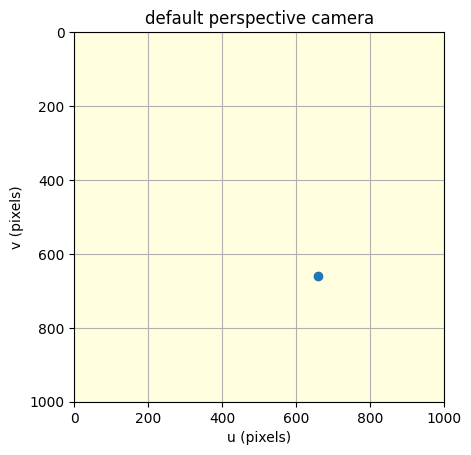

array([[     660],
       [     660]])

In [ ]:
camera.plot_point(P, "o") #Вывод на печать

In [ ]:
#Вычисление Якобиана Визуального Сервоинга

        #Для точки p0 и известной глубины объекта вычисляется якобиан визуального сервоинга,
        #который описывает зависимость между скоростью камеры в пространстве и
        #скоростью изменения изображения на плоскости изображения.

J = camera.visjac_p(p0, depth=5)  #def visjac_p(self, uv, depth): r"""
                                  #Visual Jacobian for point features
                                  #:param p: image plane point or points
                                  #:type p: array_like(2), ndarray(2,N)

                                  #:param depth: point depth
                                  #:type depth: float, array_like(N)

                                  #:return: visual Jacobian matrix
                                  #:rtype: ndarray(2,6), ndarray(2N,6)

                                  #Compute the image Jacobian :math:`\mat{J}` which maps

J

array([[    -160,        0,       32,       32,     -832,      160],
       [       0,     -160,       32,      832,      -32,     -160]])

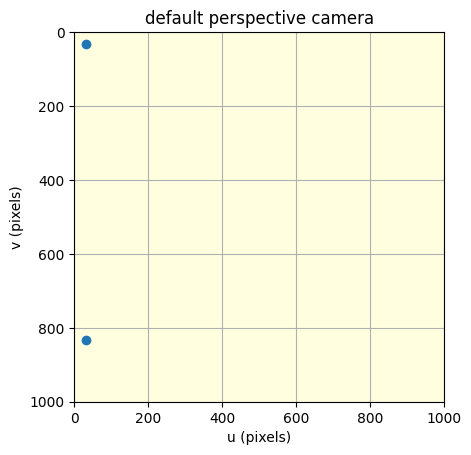

array([[    -160,        0,       32,       32,     -832,      160],
       [       0,     -160,       32,      832,      -32,     -160]])

In [ ]:
camera.plot_point(J, "o") #Вывод на печать

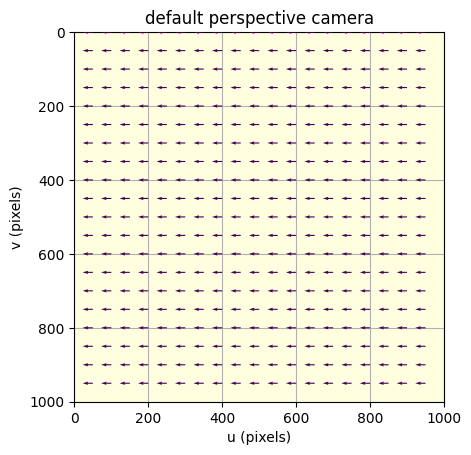

In [ ]:
#Генерация Поля Потока для Различных Движений
camera.flowfield([1, 0, 0, 0, 0, 0]);           #Демонстрируется генерация поля потока (изменение проекций точек на изображении)
                                                #для различных видов движений, заданных вектором скоростей
                                                #(перемещение вдоль оси X, вдоль оси Z, вращение вокруг оси Z, и т.д.).

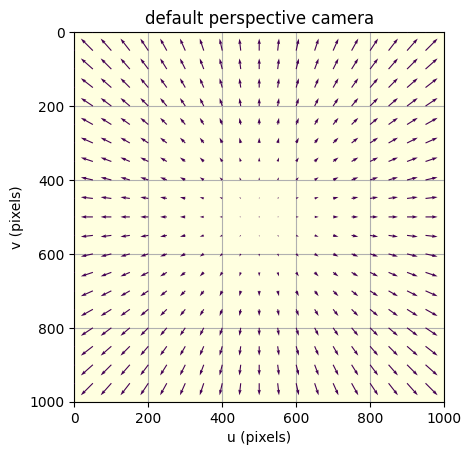

In [ ]:
camera.flowfield([0, 0, 1, 0, 0, 0]);

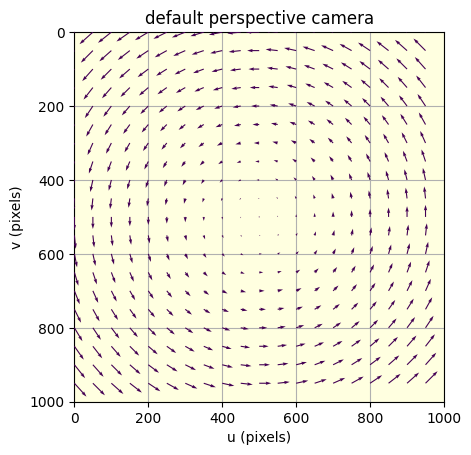

In [ ]:
camera.flowfield([0, 0, 0, 0, 0, 1]);

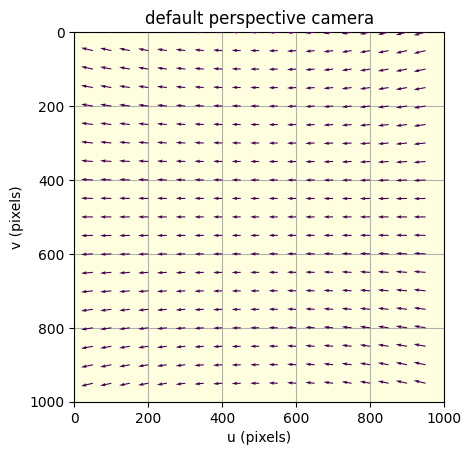

In [ ]:
camera.flowfield([0, 0, 0, 0, 1, 0]);

In [ ]:
camera.visjac_p(camera.pp, depth=1)

array([[    -800,        0,        0,        0,     -800,        0],
       [       0,     -800,        0,      800,        0,        0]])

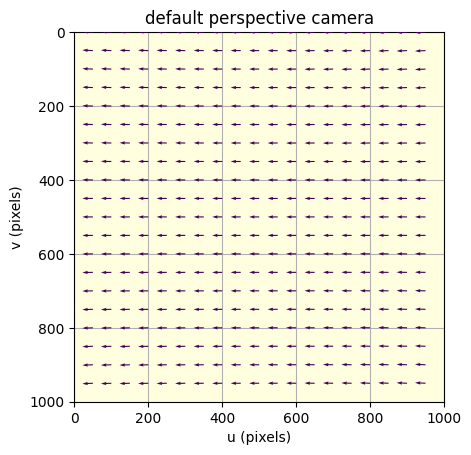

In [ ]:
#Изменение Фокусного Расстояния Камеры и Наблюдение За Эффектами
camera.f = 20e-3;
camera.flowfield([0, 0, 0, 0, 1, 0]);

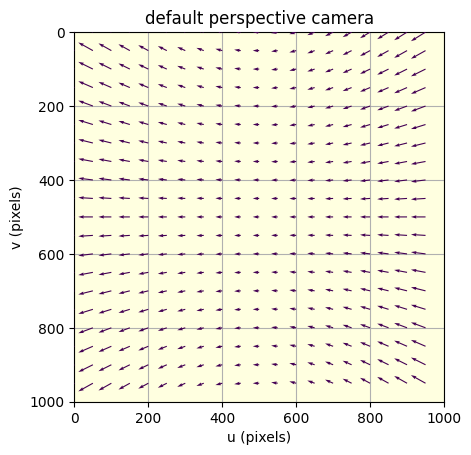

In [ ]:
camera.f = 4e-3;
camera.flowfield([0, 0, 0, 0, 1, 0]);

In [ ]:
#Вычисление Нулевого Пространства Якобиана
J = camera.visjac_p(camera.pp, depth=1); #Вычисляется якобиан для центральной точки плоскости изображения
                                         #и находится нулевое пространство этого якобиана,
                                         #что указывает на направления, в которых движение камеры не вызывает изменения в изображении
                                          #(с точностью до глубины сцены).

In [ ]:
linalg.null_space(J)

array([[       0,        0,  -0.7071,        0],
       [       0,   0.7071,        0,        0],
       [       1,        0,        0,        0],
       [       0,   0.7071,        0,        0],
       [       0,        0,   0.7071,        0],
       [       0,        0,        0,        1]])

## 15.2.2 Controlling Feature Motion


In [ ]:
camera = CentralCamera.Default(pose=SE3.Trans(1, 1, -2)); #Камера инициализируется в определенном начальном положении.

In [ ]:
camera

           Name: default perspective camera [CentralCamera]
     pixel size: 1e-05 x 1e-05
     image size: 1000 x 1000
           pose: t = 1, 1, -2; rpy/yxz = 0°, 0°, 0°
   principal pt: [     500      500]
   focal length: [   0.008    0.008]

In [ ]:
P = mkgrid(2, side=0.5, pose=SE3.Tz(3)); #Создается сетка точек P в пространстве перед камерой.
P

array([[   -0.25,    -0.25,     0.25,     0.25],
       [   -0.25,     0.25,     0.25,    -0.25],
       [       3,        3,        3,        3]])

In [ ]:
pd = 200 * np.array([[-1, -1, 1, 1], [-1, 1, 1, -1]]) + np.c_[camera.pp]
                      #Определяются желаемые координаты этих точек pd на плоскости изображения.
pd
      #np.array([[-1, -1, 1, 1], [-1, 1, 1, -1]]) создаёт двумерный массив,
      #где первая строка содержит координаты X четырех углов прямоугольника,
      #а вторая строка - соответствующие координаты Y.
      #Значения -1 и 1 выбраны так, чтобы углы располагались вокруг начала координат (0, 0)
      #в нормированном виде.

      #200 * np.array([...]) масштабирует этот прямоугольник, умножая каждую координату на 200.
      #Это преобразование делает прямоугольник больше, расширяя его во все стороны от центра

      #np.c_[camera.pp] создаёт двумерный массив из camera.pp,
      #который представляет собой координаты главной точки (principal point) изображения камеры.
      #Главная точка - это точка на сенсоре камеры, куда "падает" центральный луч
      #(обычно это центр изображения).
      # Для камеры с размером изображения 640x480 пикселей, если бы главная точка находилась в центре,
      #её координаты были бы примерно (320, 240)

      #200 * np.array([...]) + np.c_[camera.pp] сдвигает масштабированный прямоугольник так,
      #чтобы его центр находился в главной точке изображения камеры.
      #Это делается путем прибавления координат главной точки к каждой из координат прямоугольника.

      #В итоге, pd содержит координаты четырех точек прямоугольника в системе координат изображения,
      #центр которого совпадает с главной точкой камеры, и размеры которого в 200 раз больше
      #первоначального нормированного прямоугольника, созданного вокруг начала координат.
      # Этот прямоугольник может использоваться, например, для задания целевых позиций в
      #задачах визуального сервоуправления,
      #чтобы камера нацеливалась так, чтобы эти четыре точки занимали заданные позиции в поле зрения.


array([[     300,      300,      700,      700],
       [     300,      700,      700,      300]])

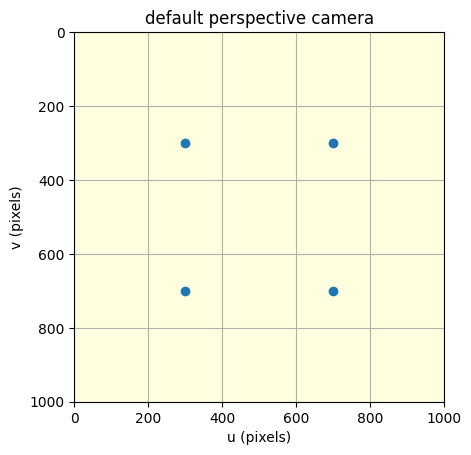

array([[     300,      300,      700,      700],
       [     300,      700,      700,      300]])

In [ ]:
camera.plot_point(pd, "o") #Вывод на печать

In [ ]:
p = camera.project_point(P) # Проекция Признаков
                            #Точки P проецируются на плоскость изображения, получая их текущие положения p.
p

array([[     300,      300,      380,      380],
       [     300,      380,      380,      300]])

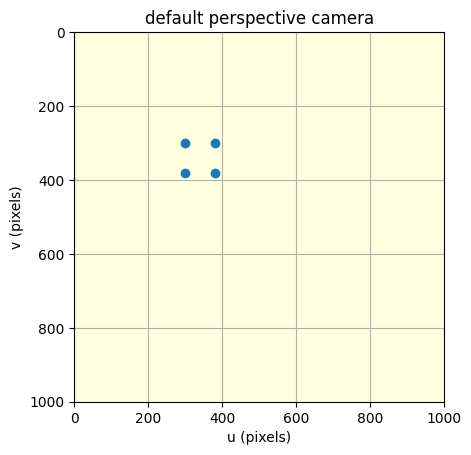

array([[     300,      300,      380,      380],
       [     300,      380,      380,      300]])

In [ ]:
camera.plot_point(p, "o") #Вывод на печать

In [ ]:
e = pd - p #Вычисление Ошибки
           #Рассчитывается ошибка e между текущими и желаемыми положениями признаков.
e

array([[       0,        0,      320,      320],
       [       0,      320,      320,        0]])

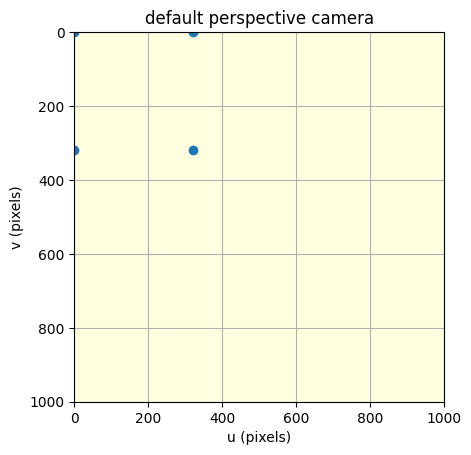

array([[       0,        0,      320,      320],
       [       0,      320,      320,        0]])

In [ ]:
camera.plot_point(e, "o") #Вывод на печать

In [ ]:
#Вычисление Якобиана
J = camera.visjac_p(p, depth=1); #Вычисляется якобиан J для текущих положений признаков.
J
#
#и стековая матрица Якобиана изображения - это матрица размером 8 x 6 в данном случае,
#поскольку p содержит четыре точки.
#Якобиан требует глубины точки, которую мы не знаем,
#поэтому сейчас мы просто выберем постоянное значение Z = 1,
# Здесь мы предоставляем одно значение, которое принимается как глубина всех точек.
#В качестве альтернативы мы могли бы предоставить одномерный массив для указания
#глубины каждой точки индивидуально.
#Это важная тема, которую мы рассмотрим в разделе 15.2.3.
#Управляющий закон определяет необходимую трансляционную и угловую скорость камеры.

array([[    -800,        0,     -200,       50,     -850,     -200],
       [       0,     -800,     -200,      850,      -50,      200],
       [    -800,        0,     -200,       30,     -850,     -120],
       [       0,     -800,     -120,      818,      -30,      200],
       [    -800,        0,     -120,       18,     -818,     -120],
       [       0,     -800,     -120,      818,      -18,      120],
       [    -800,        0,     -120,       30,     -818,     -200],
       [       0,     -800,     -200,      850,      -30,      120]])

In [ ]:
#Вектора Управления
#Определяется вектор управления v, который минимизирует ошибку,
#используя псевдообратную матрицу якобиана и множитель lmbda.
lmbda = 0.1;
            #lmbda представляет собой коэффициент усиления (или гейн)
            #в алгоритме визуального сервоуправления.
            #Этот коэффициент определяет "силу" или "шаг" реакции системы на ошибку, т.е.,
            #насколько быстро или агрессивно система будет пытаться исправить ошибку.
            #В данном случае lmbda равен 0.1, что означает,
            #что результат умножения на этот коэффициент будет уменьшать величину вектора скорости.

v = lmbda * np.linalg.pinv(J) @ e.flatten(order="F")
                             #e.flatten(order="F") преобразует массив ошибок e в одномерный массив,
                             #упорядочивая элементы по столбцам (Fortran-style order).
                             #Это нужно для того, чтобы умножение матриц было корректным.
                             #Массив e содержит разности между текущими и желаемыми положениями точек
                             #на изображении (ошибки визуального сервоуправления).
                                #@ оператор используется для выполнения матричного умножения между
                                #псевдообратной матрицей Якоби и одномерным массивом ошибок.
                                #Это действие вычисляет вектор скоростей v,
                                #который необходимо применить к системе (например, камере или манипулятору),
                                #чтобы уменьшить ошибку визуального сервоуправления.

#Результатом выполнения данного выражения является вектор скоростей v,
#который в данном случае равен array([ -0.1, -0.1, 0.4, 0, 0, 0]).
#Этот вектор показывает, как необходимо изменить положение и ориентацию системы,
#чтобы минимизировать ошибку визуального сервоуправления.
#В данном случае первые три компоненты вектора предполагают, что системе нужно сместиться
#в пространстве по осям X и Y на -0.1 и по оси Z на 0.4,
#в то время как остальные три компоненты, отвечающие за вращение, остаются равными нулю,
#что означает отсутствие необходимости в изменении ориентации.

v

array([    -0.1,     -0.1,      0.4,        0,        0,        0])

In [ ]:
#Обновление Позиции Камеры
camera.pose = camera.pose @ SE3.Delta(v);
camera.pose                               #Позиция камеры обновляется с учетом вектора управления,
                                          #что приближает текущее положение признаков к их желаемым положениям.

   1         0         0         0.9       
   0         1         0         0.9       
   0         0         1        -1.6       
   0         0         0         1         


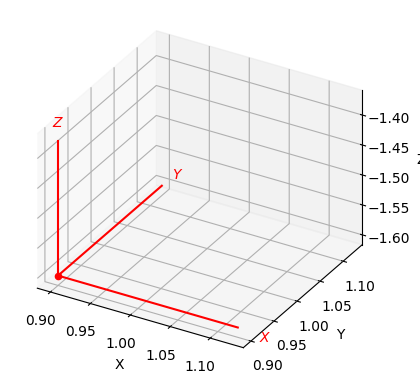

In [ ]:
#ax = plotvol3([-0.4, 0.6, -0.5, 0.5, -0.2, 1]);
#camera.plot(ax=ax, scale=0.15, shape="camera", frame=True, color="red");
camera.plot(scale=0.15, shape="circle", frame=True, color="red");
#P=[0.5, 0.1, 0.8];
         #"camera": Это обычная форма, представляющая камеру с прямоугольным корпусом и углом обзора.
         #"rectangle": Просто прямоугольник, который представляет корпус камеры без дополнительных деталей.
         #"circle": Круглая форма, которая может использоваться для представления камеры с более компактным корпусом.
         #"triangle": Треугольная форма, которая может быть использована для камер с более узким или стрелообразным корпусом.
         #"custom": Пользовательский или настраиваемый вариант формы, который может быть определен вручную.
#plot_sphere(0.03, p, color="blue");

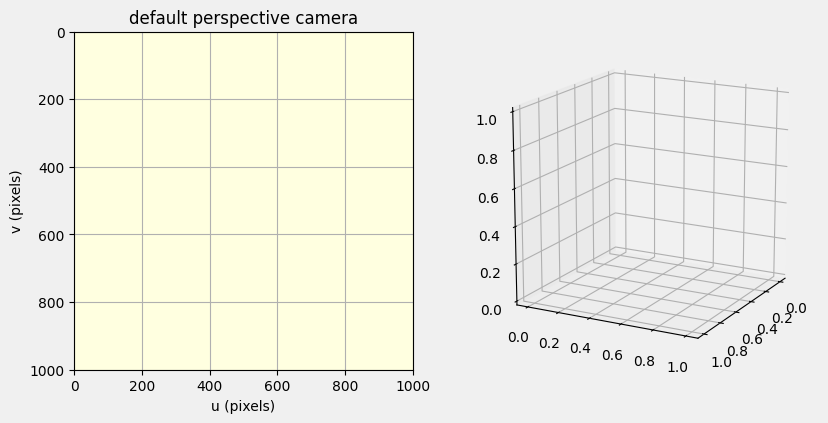

In [ ]:
camera = CentralCamera.Default(pose=SE3.Trans(1, 1, -3) * SE3.Rz(0.6));
ibvs = IBVS(camera, P=P, p_d=pd); #Инициализация
                                  #Создается и запускается экземпляр IBVS с заданными параметрами.

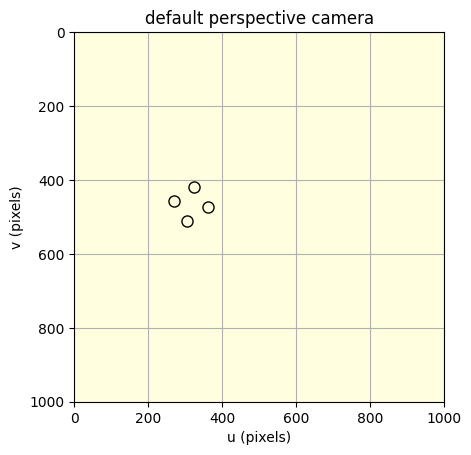

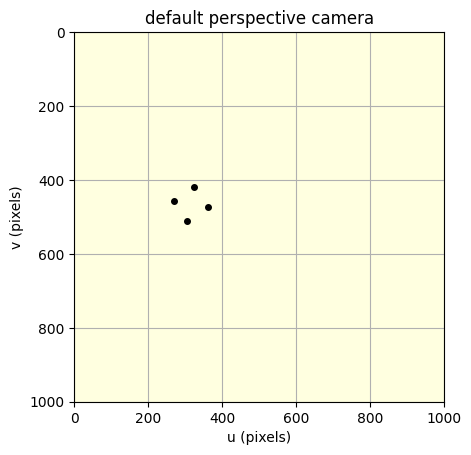

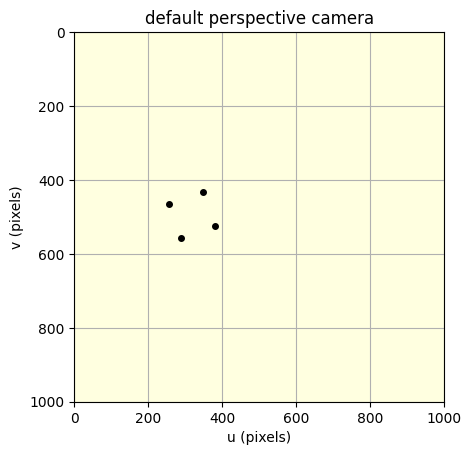

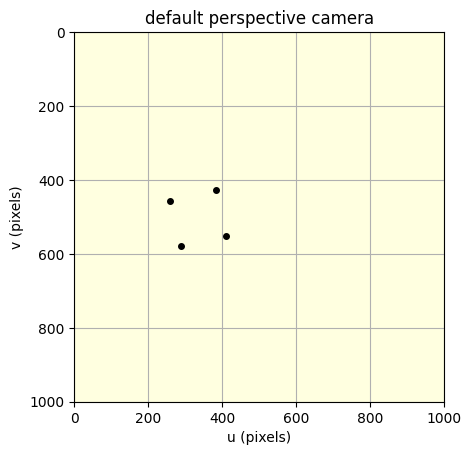

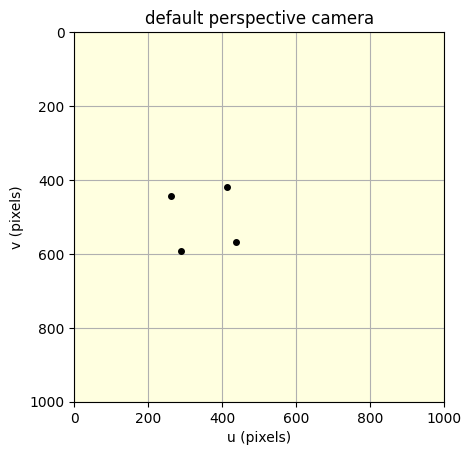

...

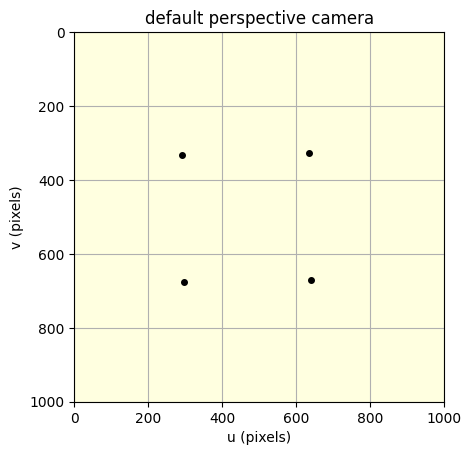

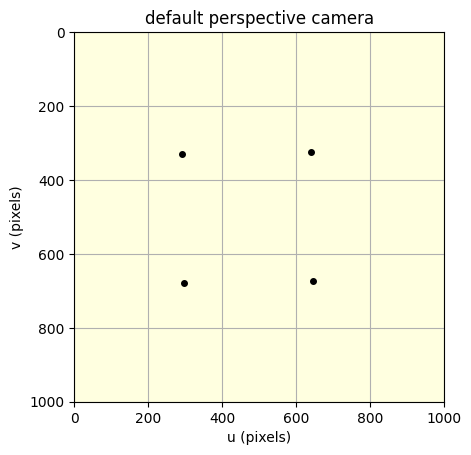

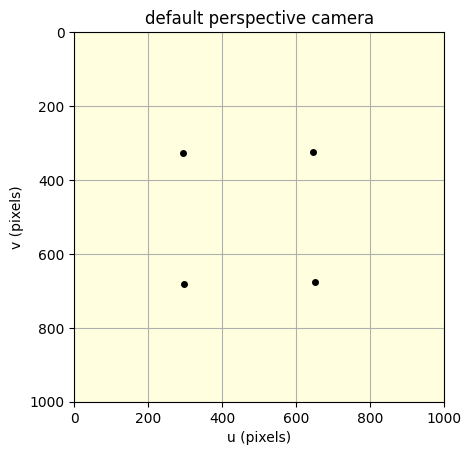

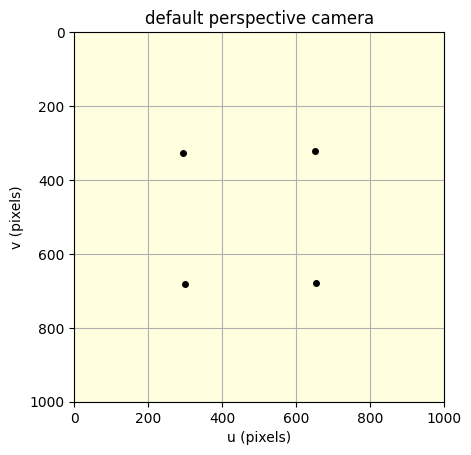

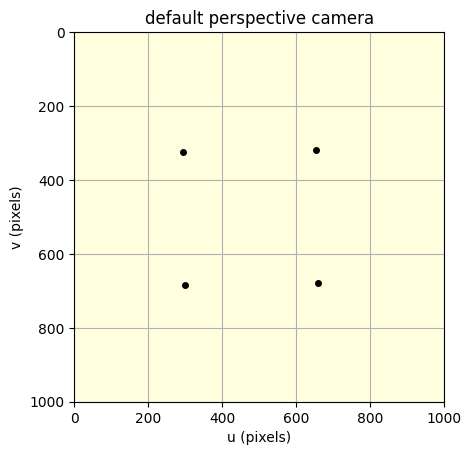

completed on iteration count


In [ ]:
ibvs.run(25);  #Запуск IBVS
                #Выполняется 25 итераций процесса IBVS,
                #стараясь минимизировать ошибку между текущими и желаемыми положениями признаков.



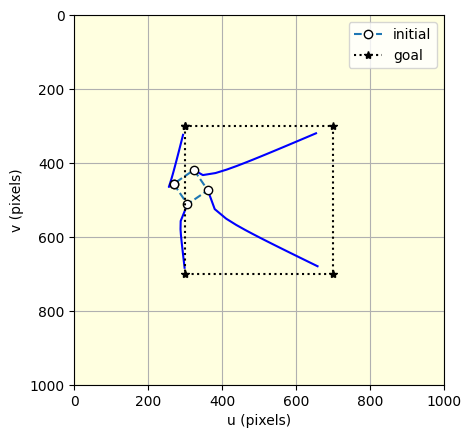

In [ ]:
ibvs.plot_p();     # plot image plane trajectory
                   #Отображаются графики, демонстрирующие траекторию признаков на плоскости изображения,
                   #скорость камеры, траекторию перемещения камеры и условные числа якобиана на каждом шаге.


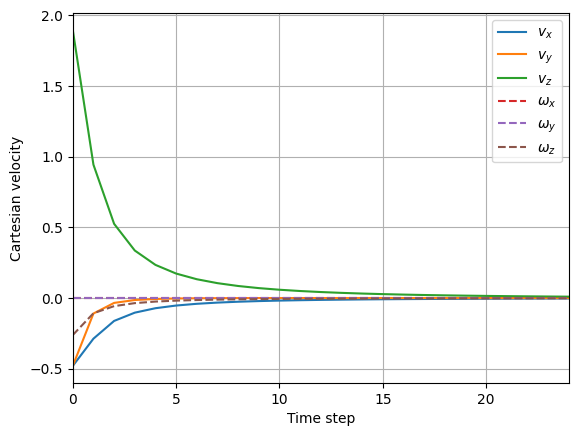

In [ ]:
ibvs.plot_vel();   # plot camera velocity

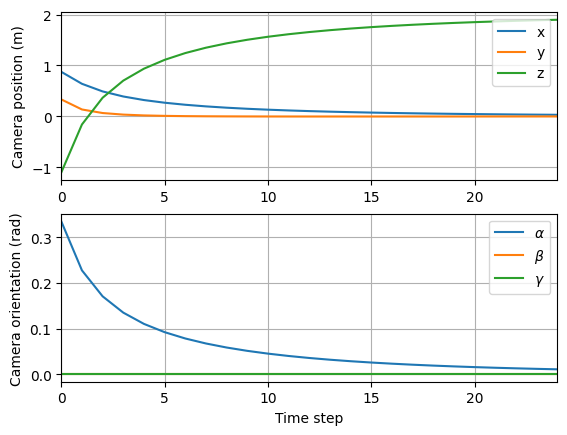

In [ ]:
ibvs.plot_pose();  # plot camera trajectory

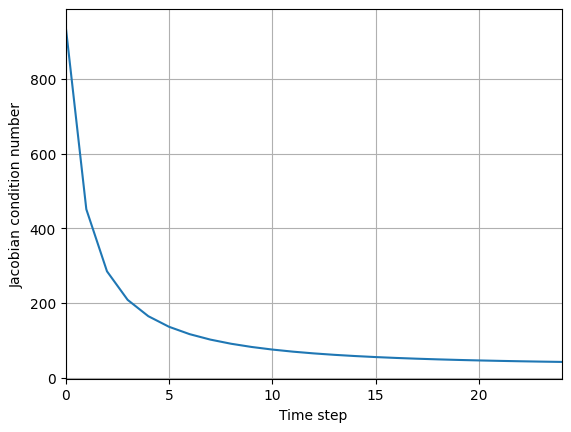

In [ ]:
ibvs.plot_jcond();

In [ ]:
#import IBVS-main

# Импорт модуля IBV-Smain
#IBVSmain = importlib.import_module("RVC3.models.IBVS-main")

In [ ]:
%run -m IBVS-main -H

AttributeError: 'NoneType' object has no attribute 'origin'

In [ ]:
out

NameError: name 'out' is not defined

In [ ]:
plt.plot(out.t, out.y2)

NameError: name 'out' is not defined

In [ ]:
plt.plot(out.clock0.t, out.clock0.x)

NameError: name 'out' is not defined

## 15.2.3 Estimating Feature Depth


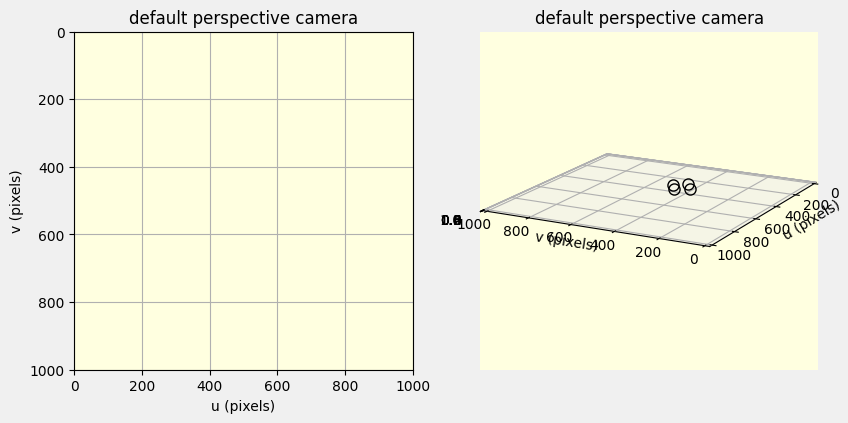

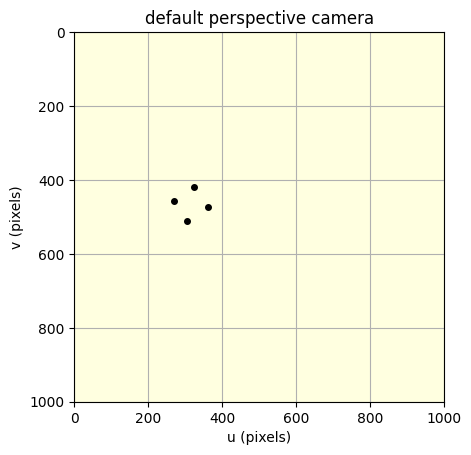

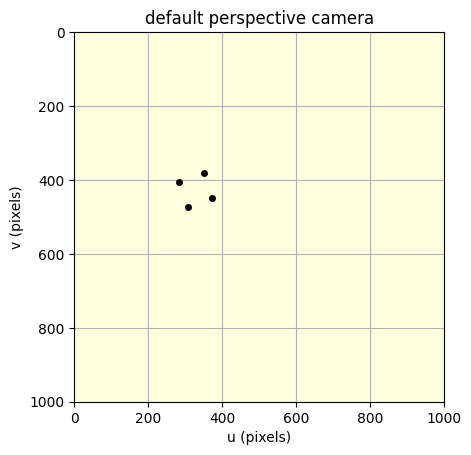

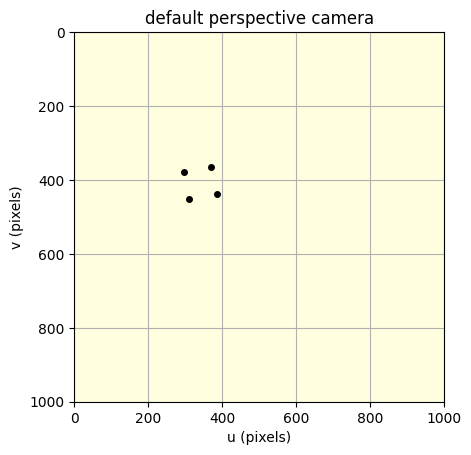

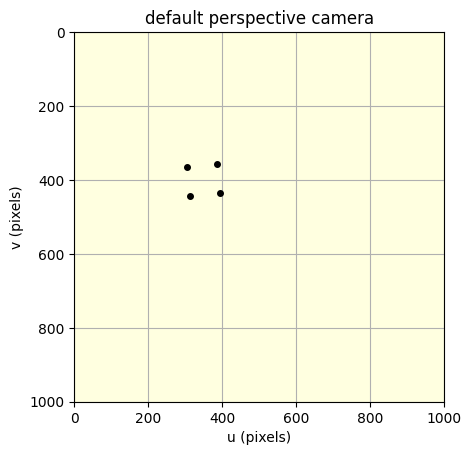

...

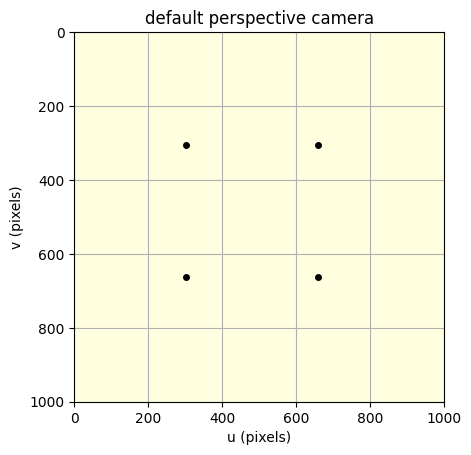

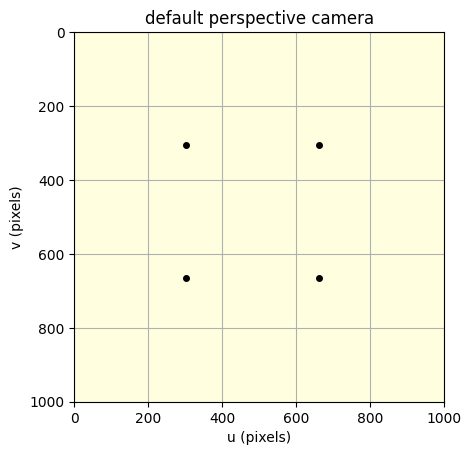

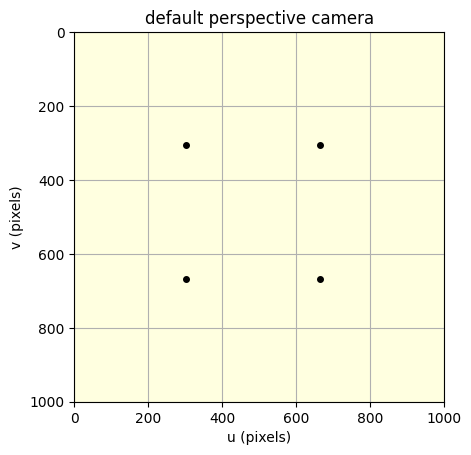

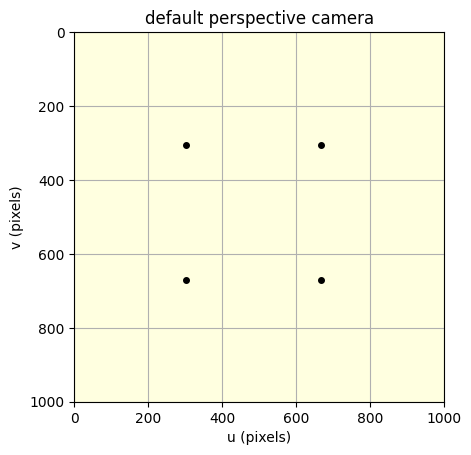

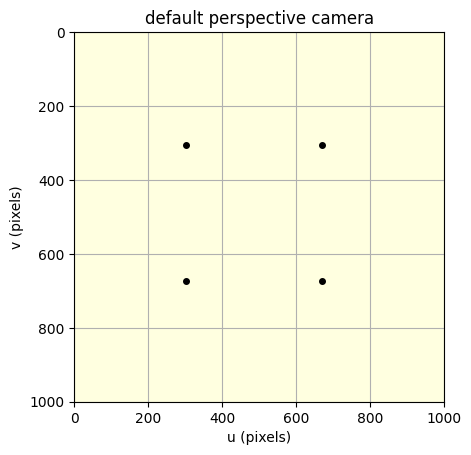

completed on iteration count


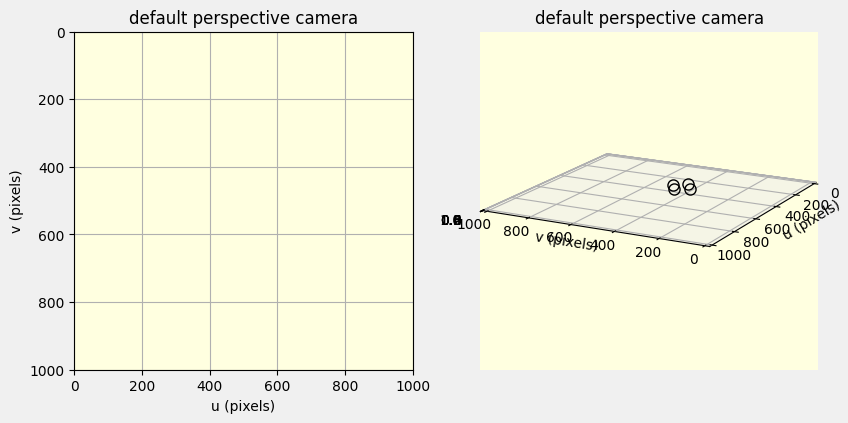

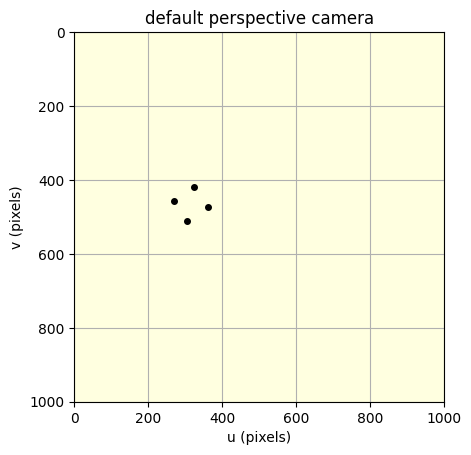

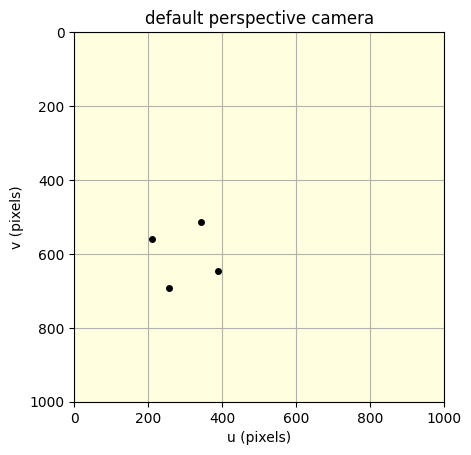

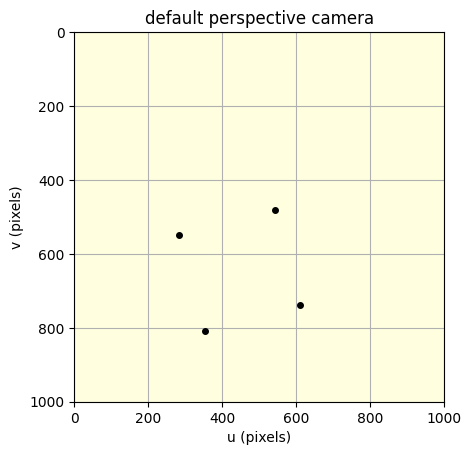

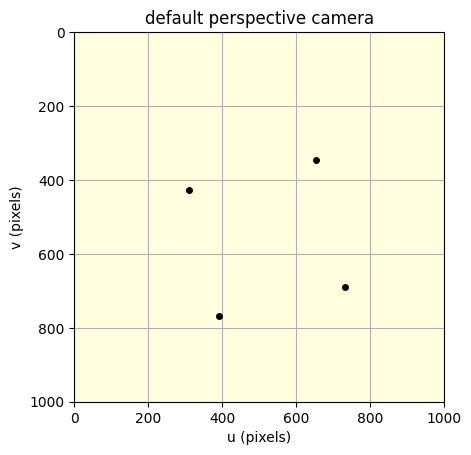

...

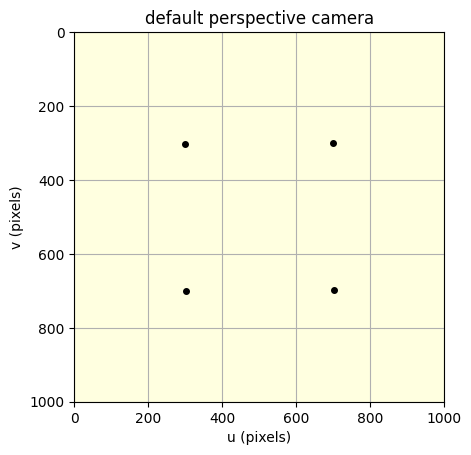

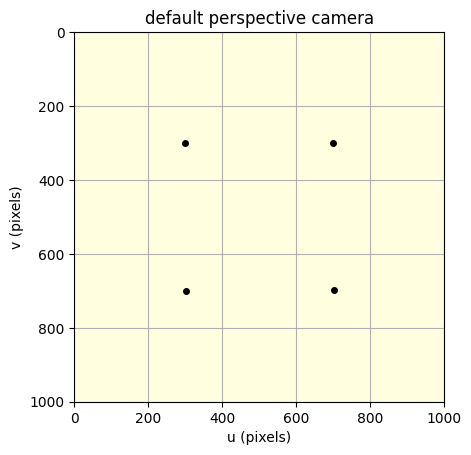

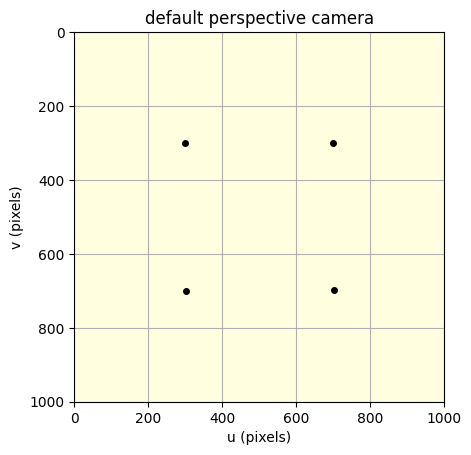

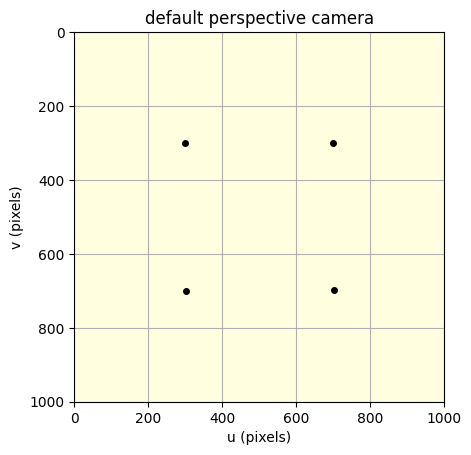

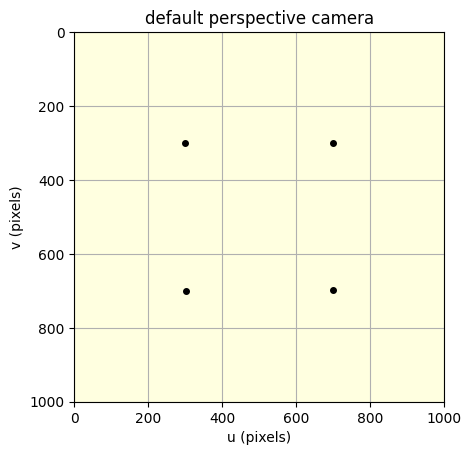

completed on iteration count


In [ ]:
ibvs = IBVS(camera, P=P, p_d=pd, depth=1);
ibvs.run(50)
ibvs = IBVS(camera, P=P, p_d=pd, depth=10);
ibvs.run(50)

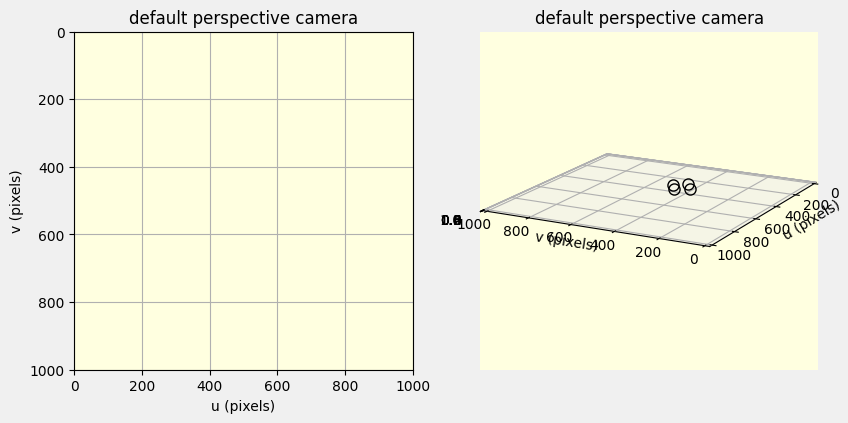

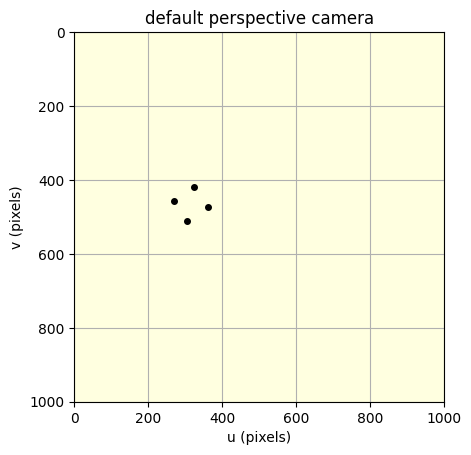

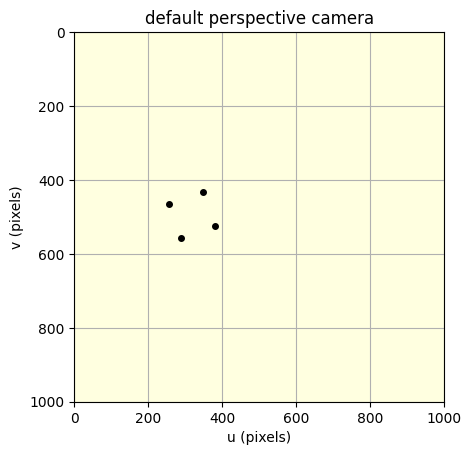

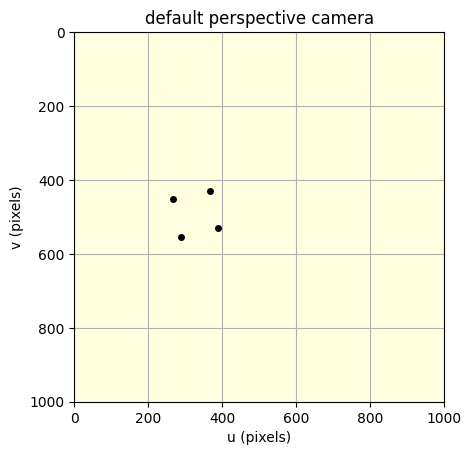

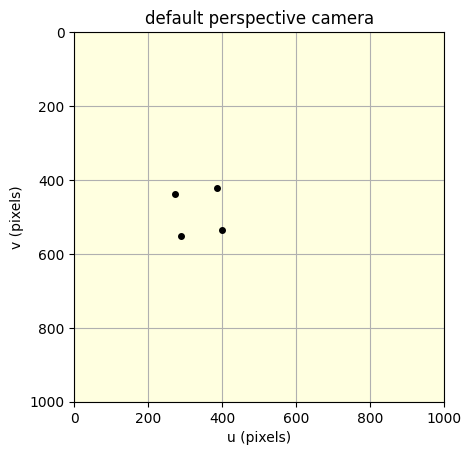

...

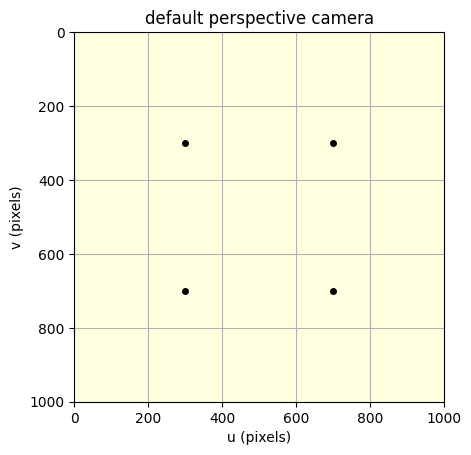

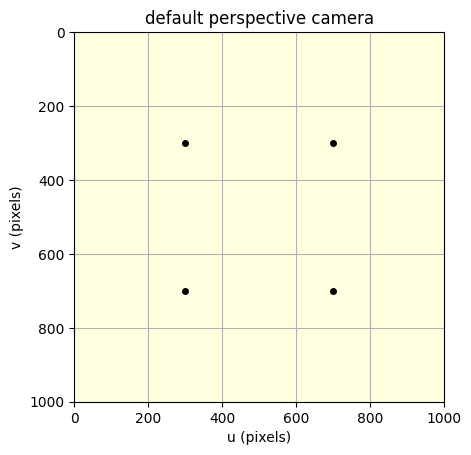

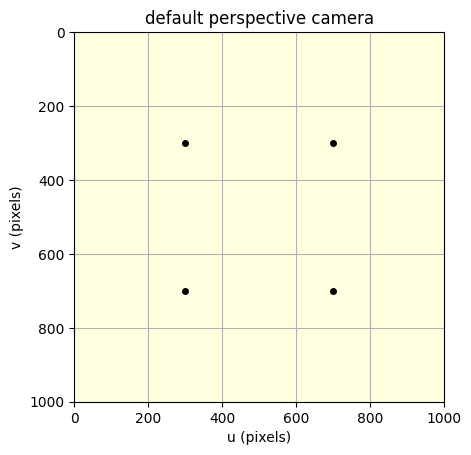

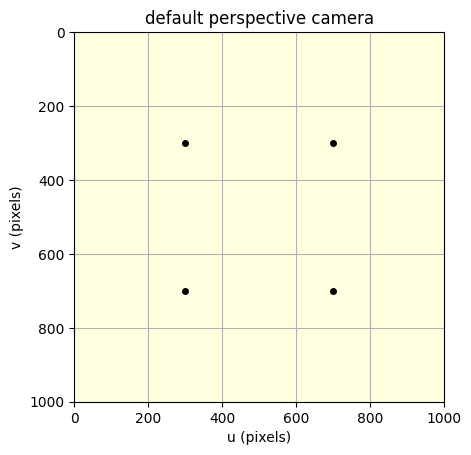

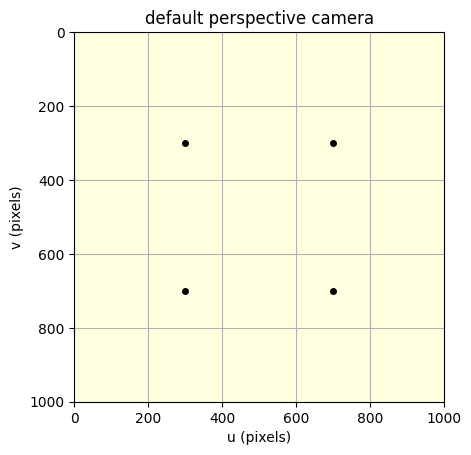

completed on error tolerance


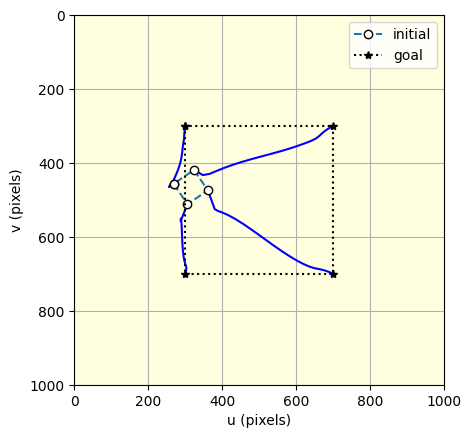

In [ ]:
ibvs = IBVS(camera, P=P, p_d=pd, depthest=True);
ibvs.run()
ibvs.plot_p()

## 15.2.4 Performance Issues


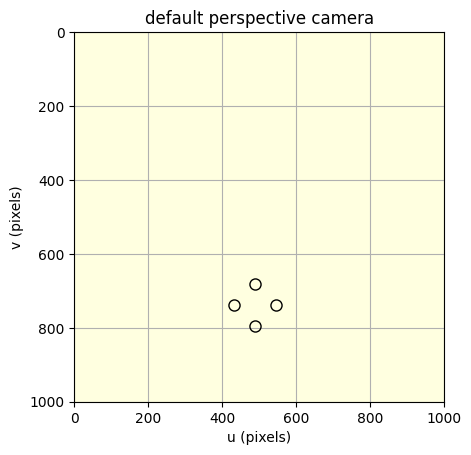

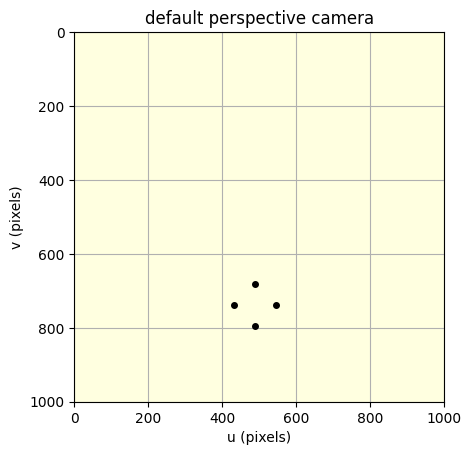

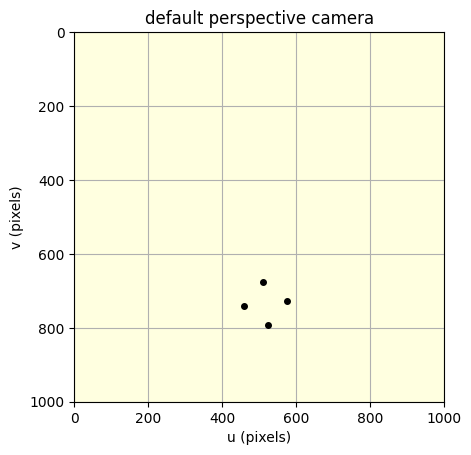

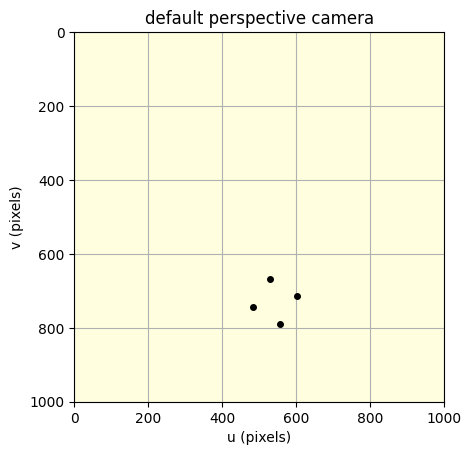

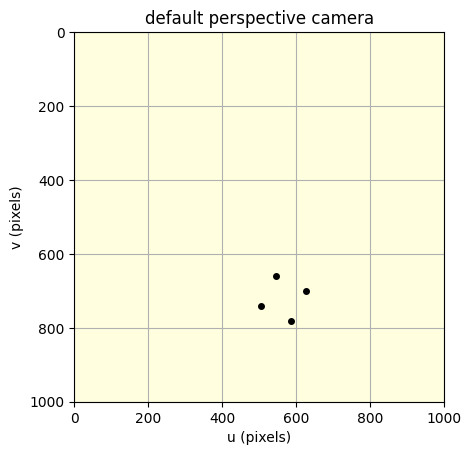

...

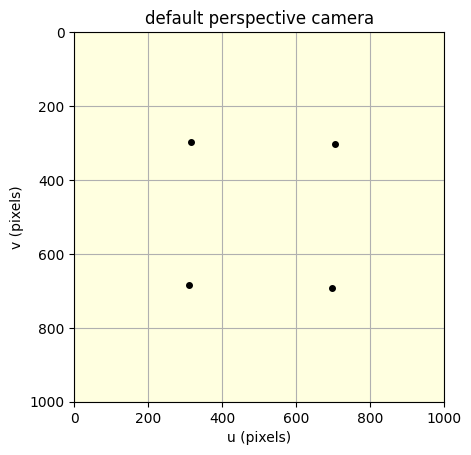

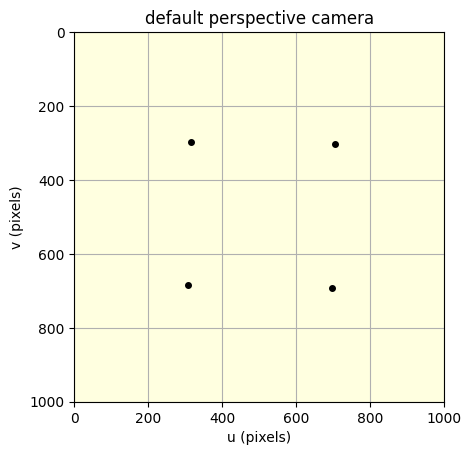

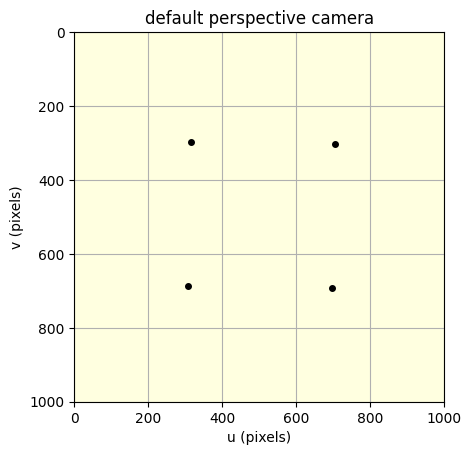

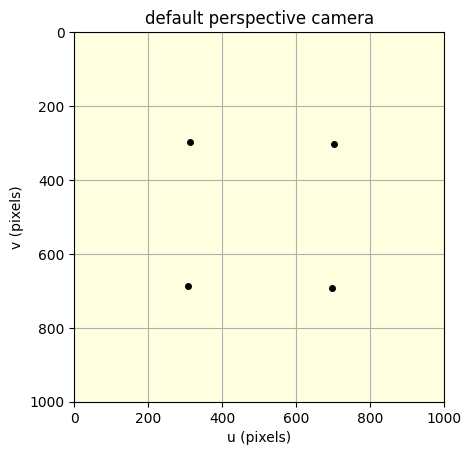

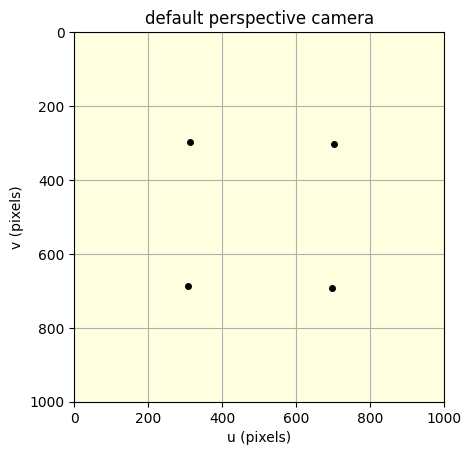

completed on iteration count


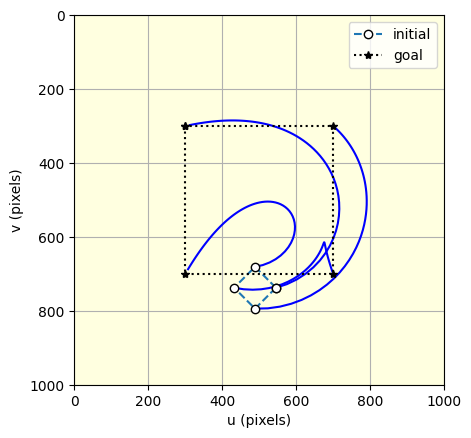

In [ ]:
pbvs.pose_0 = SE3.Trans(-2.1, 0, -3) * SE3.Rz(5*pi/4);
      #pbvs.pose_0 устанавливается в конкретное начальное положение и ориентацию.
      #После этого запускается алгоритм PBVS (pbvs.run()), который пытается минимизировать
      #разницу между текущим положением камеры и желаемым положением,
      #используя информацию о местоположении объекта в трехмерном пространстве.
pbvs.run()
pbvs.plot_p()

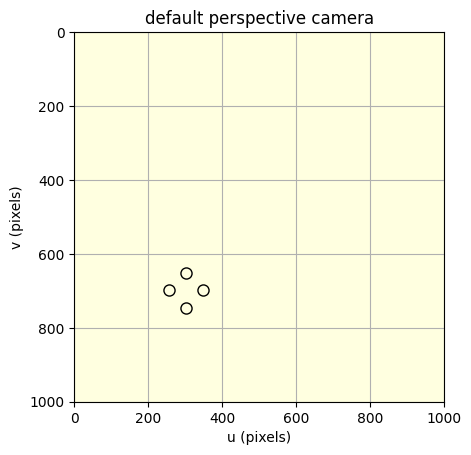

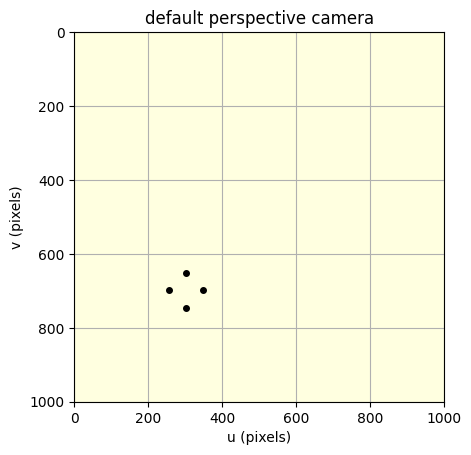

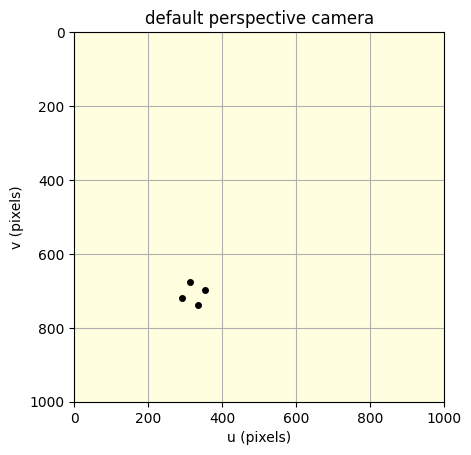

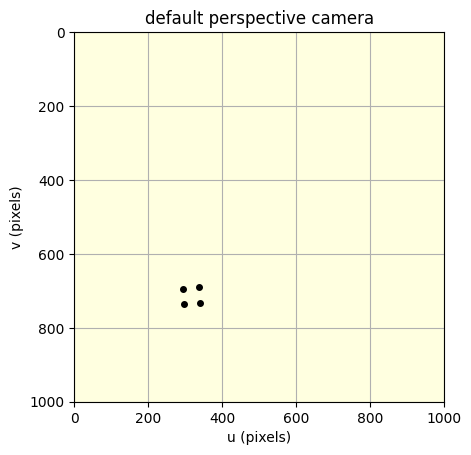

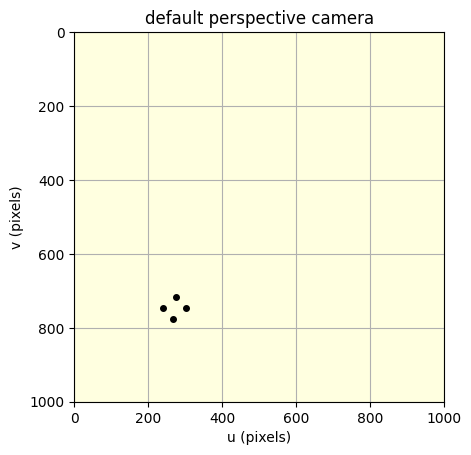

...

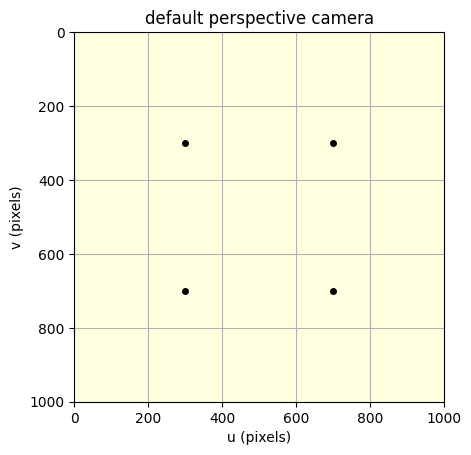

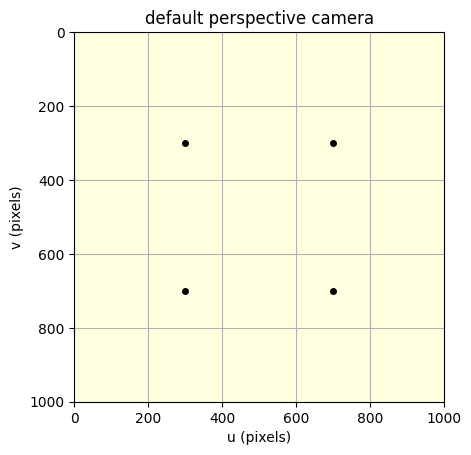

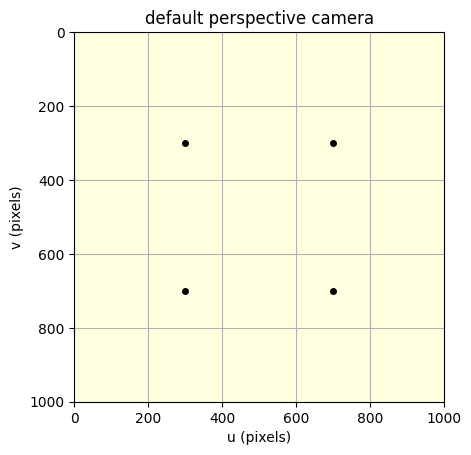

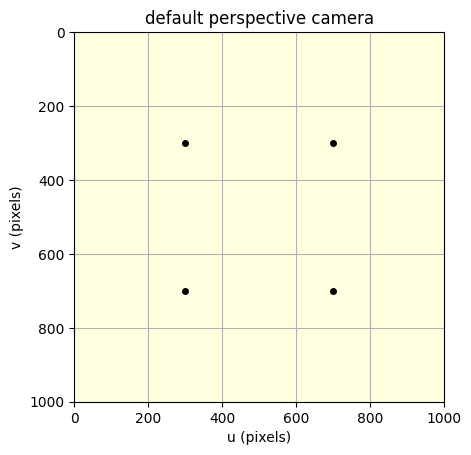

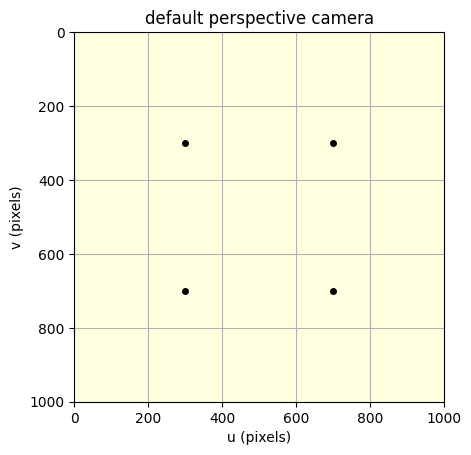

completed on error tolerance


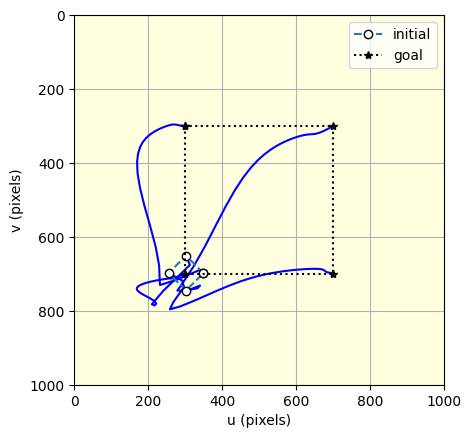

In [ ]:
#Применение Начального Положения PBVS к IBVS
ibvs.pose_0 = pbvs.pose_0; #Здесь начальное положение для IBVS (ibvs.pose_0)
                           #устанавливается равным последнему положению, достигнутому PBVS.
                           #После этого запускается алгоритм IBVS,
                           #который использует разницу между текущим и желаемым положениями изображений на плоскости изображения
                           #для управления камерой.
ibvs.run()
ibvs.plot_p(); #Визуализация Траектории Признаков

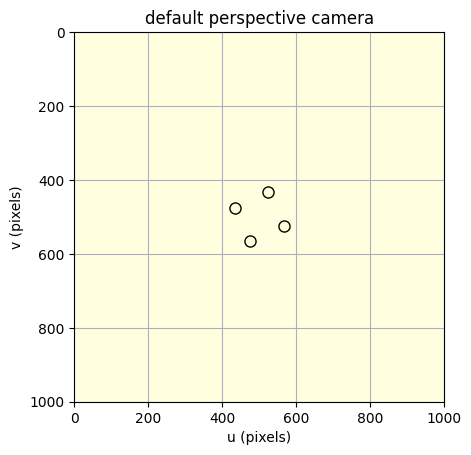

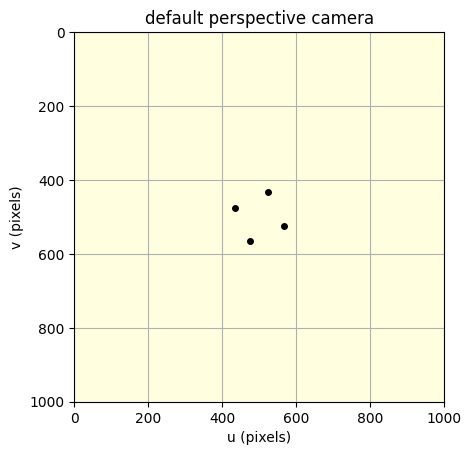

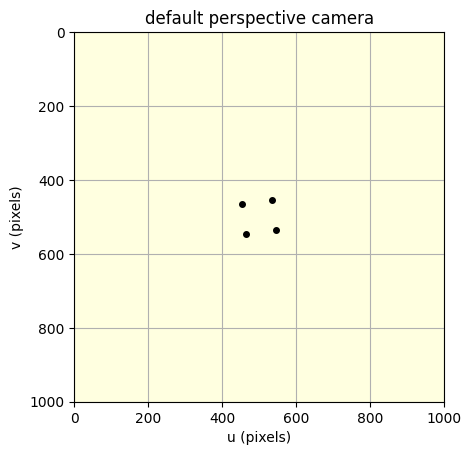

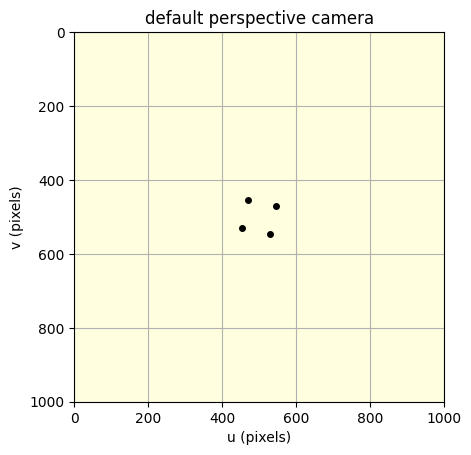

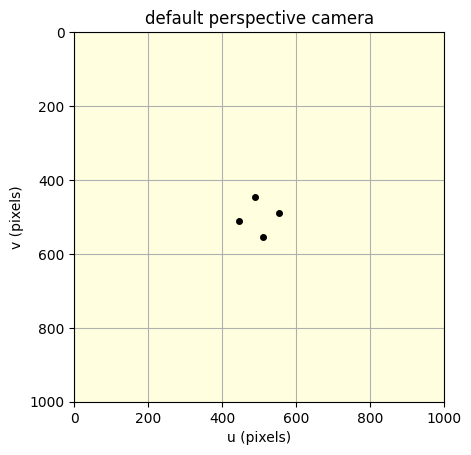

...

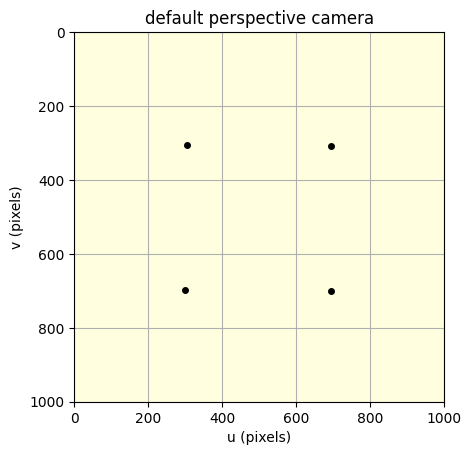

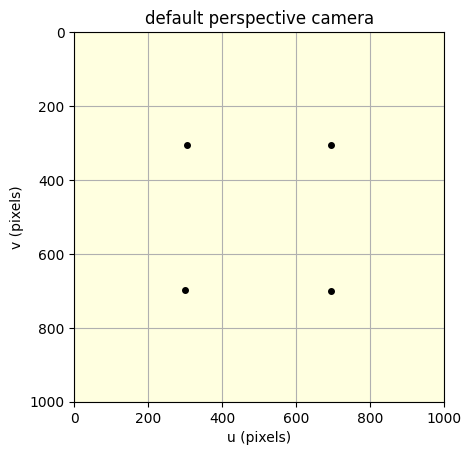

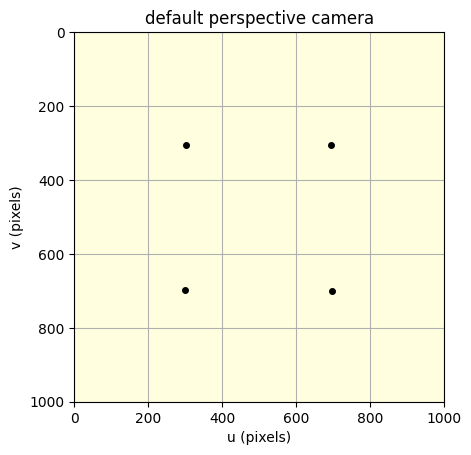

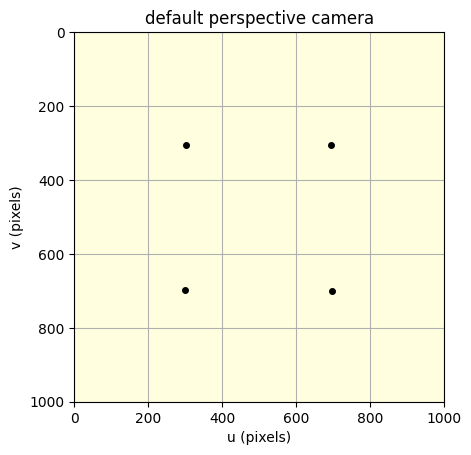

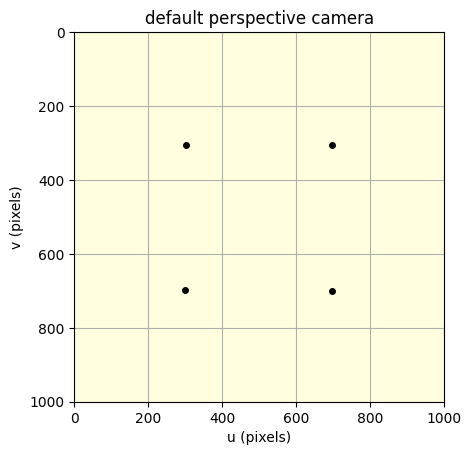

completed on iteration count


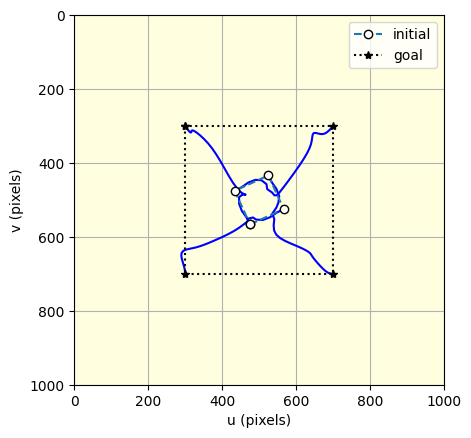

In [ ]:
ibvs.pose_0 = SE3.Tz(-1) * SE3.Rz(2);
ibvs.run(50)
ibvs.plot_p();

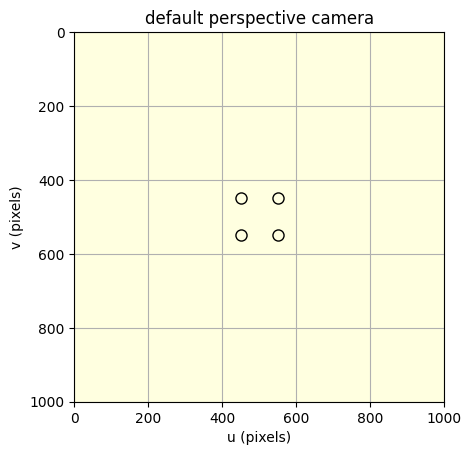

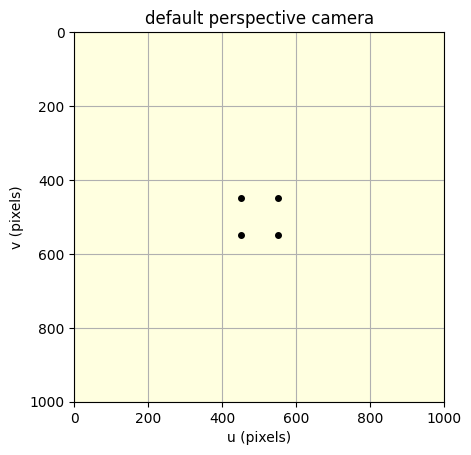

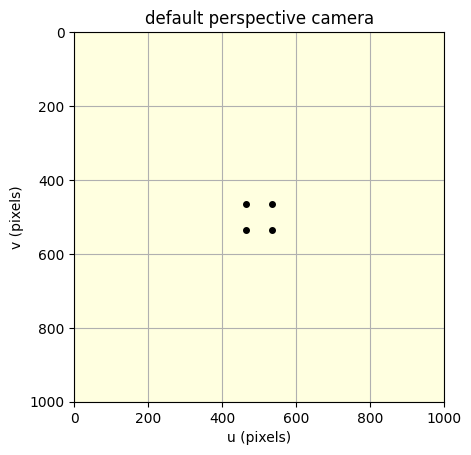

LinAlgError: SVD did not converge in Linear Least Squares

In [ ]:
#Дальнейшее Изменение Начальной Позиции и Запуск IBVS
ibvs.pose_0 = SE3.Tz(-1) * SE3.Rz(pi);
ibvs.run(5)
ibvs.plot_p();

# 15.3 Using Other Image Features


## 15.3.1 Line Features


In [ ]:
P = circle([0, 0, 3], 0.5, resolution=3);
              #Здесь создается круг (circle) как набор точек P,
              #которые расположены вокруг центра в плоскости Z=3 с радиусом 0.5.
              #Разрешение установлено так, чтобы формировать трехугольник (три точки на окружности).

P

array([[     0.5,    -0.25,    -0.25],
       [       0,    0.433,   -0.433],
       [       3,        3,        3]])

Canned example: line-based IBVS with three lines


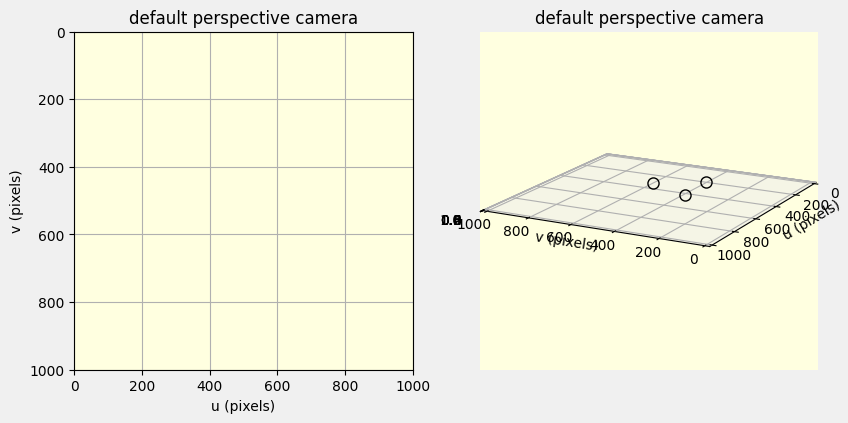

completed on error tolerance
Can only plot image plane trajectories for point-based IBVS


In [ ]:
ibvs = IBVS_l.Example(camera);  # quick problem setup
                                #IBVS_l.Example(camera) инициализирует пример IBVS с использованием линейных признаков и камеры.
                                #Это может быть реализация, специализированная на работе с линейными признаками,
                                #например, краями или линиями, обнаруженными на изображении.

                                  #ibvs.run() запускает процесс визуального сервоинга,
                                  #в ходе которого система старается минимизировать разницу между текущим и желаемым положениями
                                  #линейных признаков на изображении.

ibvs.run()
ibvs.plot_p()

## 15.3.2 Ellipse Features


In [ ]:
P = circle([0, 0, 3], 0.5, resolution=10); #Здесь P — это набор точек, образующих круг в пространстве
                                           #с центром в точке [0, 0, 3] и радиусом 0.5.
                                           #Высокое разрешение (resolution=10) означает, что круг аппроксимируется 10 точками,
                                           #что позволяет при проекции на изображение сформировать эллипс.
P

array([[     0.5,   0.4045,   0.1545,  -0.1545,  -0.4045,     -0.5,  -0.4045,  -0.1545,   0.1545,   0.4045],
       [       0,   0.2939,   0.4755,   0.4755,   0.2939,        0,  -0.2939,  -0.4755,  -0.4755,  -0.2939],
       [       3,        3,        3,        3,        3,        3,        3,        3,        3,        3]])

In [ ]:
p = camera.project_point(P, pose=camera.pose, retinal=True); #Точки P проецируются на изображение с учетом текущей позиции камеры,
                                                             #результатом являются координаты p на плоскости изображения.
                                                             #retinal=True -- convert to retinal image coordinates
p

array([[0.001994, 0.001619, 0.0006243, -0.0006101, -0.001612,   -0.002, -0.001625, -0.0006298, 0.0006046, 0.001607],
       [-1.306e-05, 0.001163, 0.001894,   0.0019,  0.00118, 7.623e-06, -0.001168, -0.001899, -0.001905, -0.001185]])

In [ ]:
#пределение Параметров Эллипса
x, y = p                    #Разделение проекций на компоненты x и y.

A = np.column_stack([y**2, -2*x*y, 2*x, 2*y, np.ones(x.shape)]); #Формирование матрицы A из координат x и y,
                                                                 #представляющей параметры эллипса в обобщенном виде.
                                                                 #Эта матрица содержит коэффициенты квадратичной формы,
                                                                 #соответствующей эллипсу на плоскости изображения.
b = -(x**2);
E, *_ = np.linalg.lstsq(A, b, rcond=None)  #Решение системы линейных уравнений методом наименьших
                                           #квадратов для определения коэффициентов эллипса E.

In [ ]:
#Вычисление Якобиана Для Эллипсных Признаков
plane = [0, 0, 1, -3];  # plane Z=3  Определение плоскости, на которой лежит эллипс, с использованием параметров plane.
J = camera.visjac_e(E, plane);   #Вычисление якобиана J для эллипса с учетом его плоскости в пространстве.
                                  #Это дает матрицу, описывающую, как изменения в положении и ориентации камеры влияют
                                  #на параметры эллипса на изображении.
J.shape

(5, 6)

canned example, ellipse + point-based IBVS
IBVS_e constructor


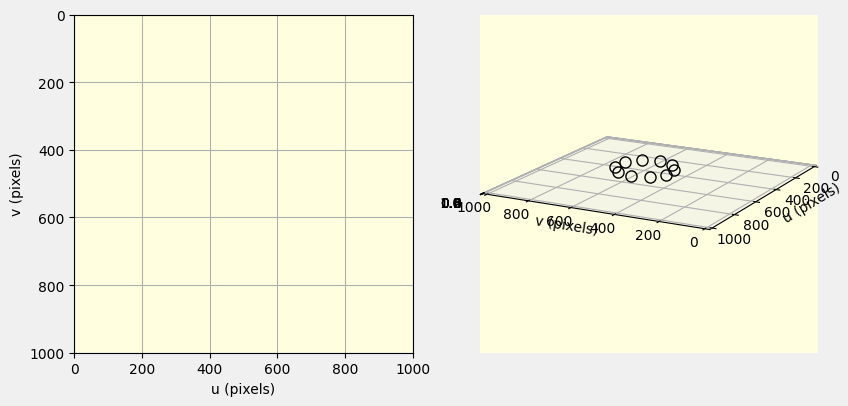

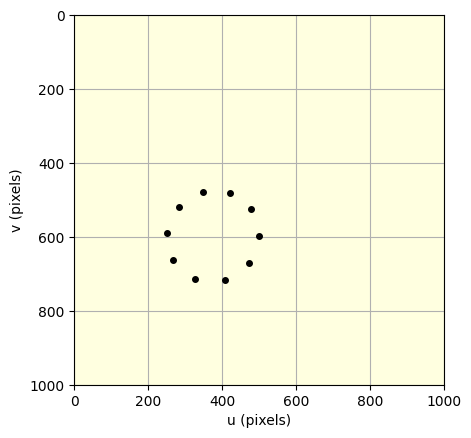

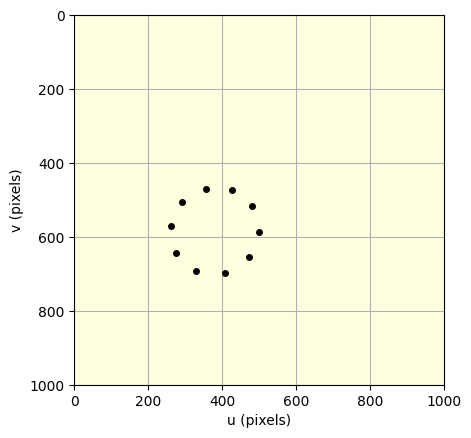

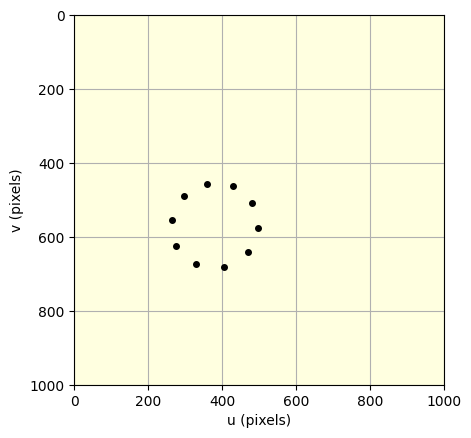

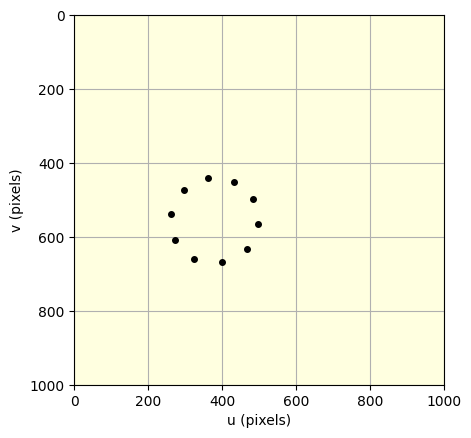

...

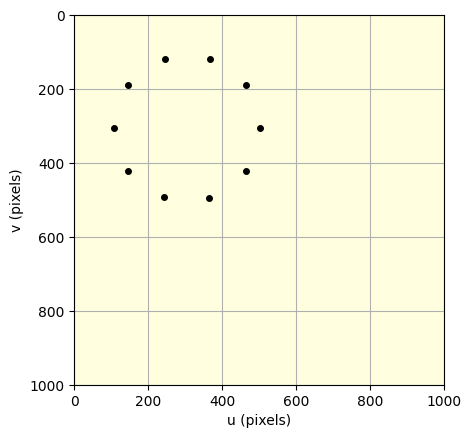

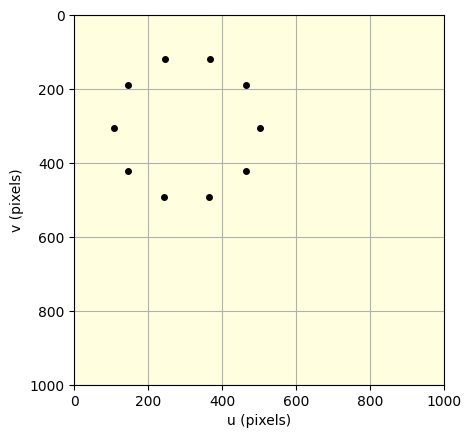

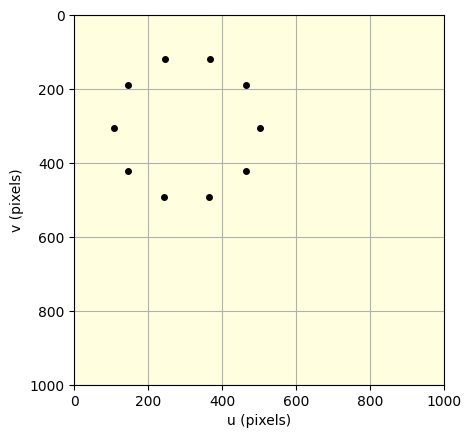

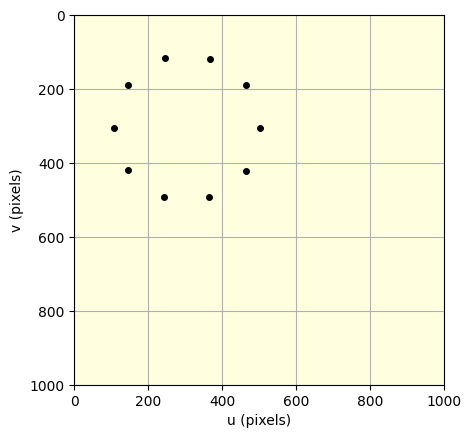

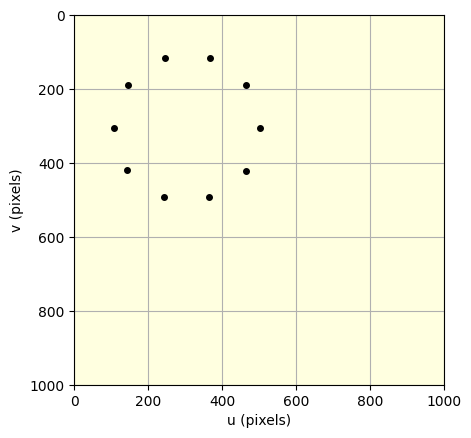

completed on iteration count


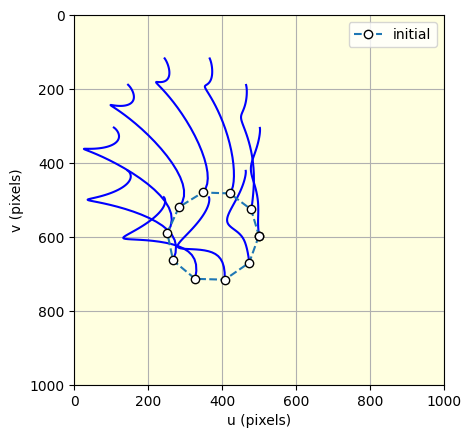

In [ ]:
ibvs = IBVS_e.Example();  # quick problem setup
                           #Инициализация и запуск процесса IBVS с использованием эллипсных признаков.
                           #Класс IBVS_e предназначен для работы с эллипсными признаками.
                           #Example() создает предварительно настроенный экземпляр задачи IBVS с этими признаками.

                            #Метод run() запускает процесс IBVS, который стремится управлять движением камеры так,
                            #чтобы признаки на изображении (в данном случае, эллипс) соответствовали заданным целевым параметрам.
ibvs.run()
ibvs.plot_p()

## 15.3.3 Photometric Features


# 15.4 Wrapping Up


## 15.4.1 Further Reading


## 15.4.2 Exercises
